# Time Series Forecasting - Autoregressive Models

Libraries used : pmdarima, statsmodel

## Articles 
 For ar,ma, arma, arima, sarima

1. https://towardsdatascience.com/time-series-models-d9266f8ac7b0#:~:text=AR%2C%20MA%2C%20ARMA%2C%20and%20ARIMA%20models%20are%20used,over%20the%20historical%20data%20of%20observation%20overtime%20period.

2. https://puneet166.medium.com/time-series-forecasting-how-to-predict-future-data-using-arma-arima-and-sarima-model-8bd20597cc7b#:~:text=ARIMA%2C%20ARMA%20and%20SARIMA%20are%20used%20for%20predict,how%20to%20do%20forecasting%20using%20these%20three%20models.


In [1]:
#%pip install pmdarima

import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import datetime
import math
import warnings


import pmdarima as pmd
from sklearn.metrics import mean_squared_error
from math import sqrt
from statsmodels.tsa.arima_model import ARMA, ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')

In [2]:
# In order to use this notebook for univarate time series analysis :-
# 1) The primary requirement is not to have missing values or categorial(string) data for time_dependent variable 
#    and time_column.
# 2) This cell requires information on file_name (only csv), time_dependent_variable, time_column, date_time format (frmt)
#    and resample grain(X). After filling the required information correctly, you can run all the cells (Cell ---> Run All)
# 3) Example :-
#   file_name               = "JetRail Avg Hourly Traffic Data - 2012-2013.csv"
#   time_dependent_variable = "Count"    (column name in your dataset)
#   time_column             = "Datetime" (column name in your dataset)
#   frmt                    = "%Y-%m-%d"
#   X                       = "D" 

file_name = "JetRail Avg Hourly Traffic Data - 2012-2013.csv"
time_dependent_variable = "Count"
time_column = "Datetime"
frmt =  "%Y-%m-%d"
Resample_grain = "D"
split= .9          #train and test split

### Reading the csv file

In [3]:
def data(method = "csv"):
    df = pd.read_csv(file_name, parse_dates= True)
    df[time_column] = pd.to_datetime(df[time_column],format=frmt) 
    df.index = df[time_column]
    df = df.resample(Resample_grain).mean()
    df.reset_index(inplace= True)
    return df
df = data()

### Splitting the data into train and test

In [4]:
def train_test_split_perc(df):
    total_size=len(df)
    train_size=math.floor(split*total_size)  #(70% Dataset)
    train=df.head(train_size)
    test=df.tail(len(df) -train_size)
    return train, test
train, test = train_test_split_perc(df)
y_hat = test.copy()

In [5]:
def train_test_split_date(df, split_date):
    split_date = '2017-01-01'
    train = df.loc[df.index <= split_date].copy()
    test = df.loc[df.index > split_date].copy()
    return train, test

### Metrics

Probabilistic Model Selection with AIC/BIC in Python

Article :https://medium.com/analytics-vidhya/probabilistic-model-selection-with-aic-bic-in-python-f8471d6add32#:~:text=AIC%20and%20BIC%20techniques%20can%20be%20implemented%20in,statsmodels.formula.api%20provides%20a%20direct%20approach%20to%20compute%20aic%2Fbic.
Video : https://campus.datacamp.com/courses/arima-models-in-python/chapter-3-the-best-of-the-best-models?ex=4

In [6]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [7]:
from sklearn import metrics

def timeseries_evaluation_metrics_func(y_true, y_pred):
    
    print('Evaluation metric results:-')
    print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
    print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
    print(f'MAPE is : {mean_absolute_percentage_error(y_true,y_pred)}')
    print(f'R2 is : {metrics.r2_score(y_true, y_pred)}')
    print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}',end='\n\n')

### Defining a plot function

In [8]:
 def plot( method):
    plt.figure(figsize=(12,8))
    plt.plot(train[time_column], train[time_dependent_variable], label='Train')
    plt.plot(test[time_column],test[time_dependent_variable], label='Test')
    plt.plot(y_hat[time_column],y_hat[method], label= method +' forecast')
    plt.legend(loc='best')
    plt.title(method + ' forecast')
    plt.show()
    timeseries_evaluation_metrics_func(y_hat[time_dependent_variable], y_hat[method])
    


# Function Simple Average Approach

In [9]:
def simple_avg_forecasting(method= 'simple_avg'):

    y_hat[method] = train[time_dependent_variable].mean()

    

simple_avg_forecasting()

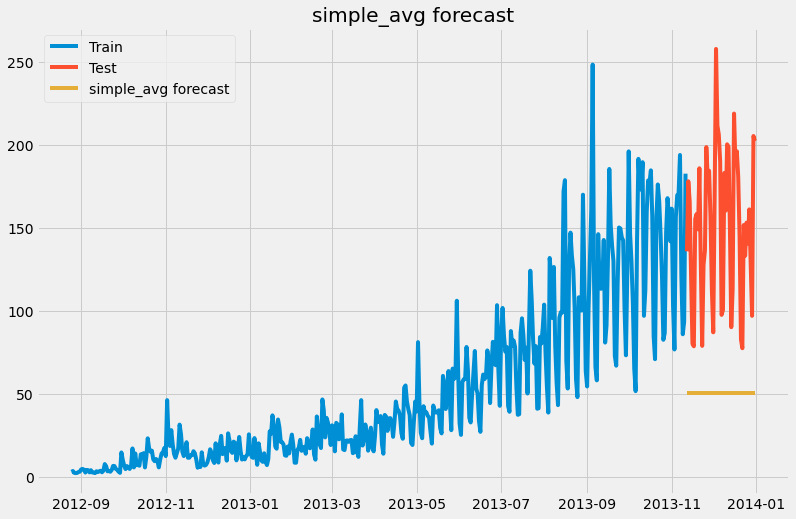

Evaluation metric results:-
MSE is : 12157.637195096277
MAE is : 101.3260135135135
MAPE is : 63.324175099834854
R2 is : -5.430311716056996
RMSE is : 110.26167600347945



In [10]:
plot(method= 'simple_avg' )

# AR

If you want only specific list of lags like 1 & 3 as AR components, then you can do that in the following way
https://stackoverflow.com/questions/55882111/arima-model-for-certain-lags

# Choose the metrics that you want to minimize

In [14]:
def metrics_( method):
    mse = mean_squared_error(test[time_dependent_variable], y_hat[method])
     
    mae = metrics.mean_absolute_error(test[time_dependent_variable], y_hat[method])
    mape = mean_absolute_percentage_error(test[time_dependent_variable], y_hat[method])
    r2 = metrics.r2_score(test[time_dependent_variable], y_hat[method])
    return mape


20.76889644429782

In [11]:
trend = "ct"

https://towardsdatascience.com/advanced-time-series-analysis-with-arma-and-arima-a7d9b589ed6d

In [12]:
def diagnostic_plot(model_fit, lags= 30):
    fig = plt.figure(figsize=(16, 9))
    fig = model_fit.plot_diagnostics(fig=fig, lags=lags)
    print(model_fit.summary())
    print("aic = " +  str(model_fit.aic))
    print("bic = " + str(model_fit.bic))

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:                     AutoReg(7)   Log Likelihood               -1823.021
Method:               Conditional MLE   S.D. of innovations             15.685
Date:                Sat, 09 Oct 2021   AIC                              5.551
Time:                        09:49:55   BIC                              5.645
Sample:                             7   HQIC                             5.588
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -2.1753      1.833     -1.187      0.235      -5.768       1.417
trend          0.0367      0.015      2.386      0.017       0.007       0.067
Count.L1       0.4992      0.045     11.083      0.0

<module 'sklearn.metrics' from 'C:\\ProgramData\\Anaconda3\\lib\\site-packages\\sklearn\\metrics\\__init__.py'>

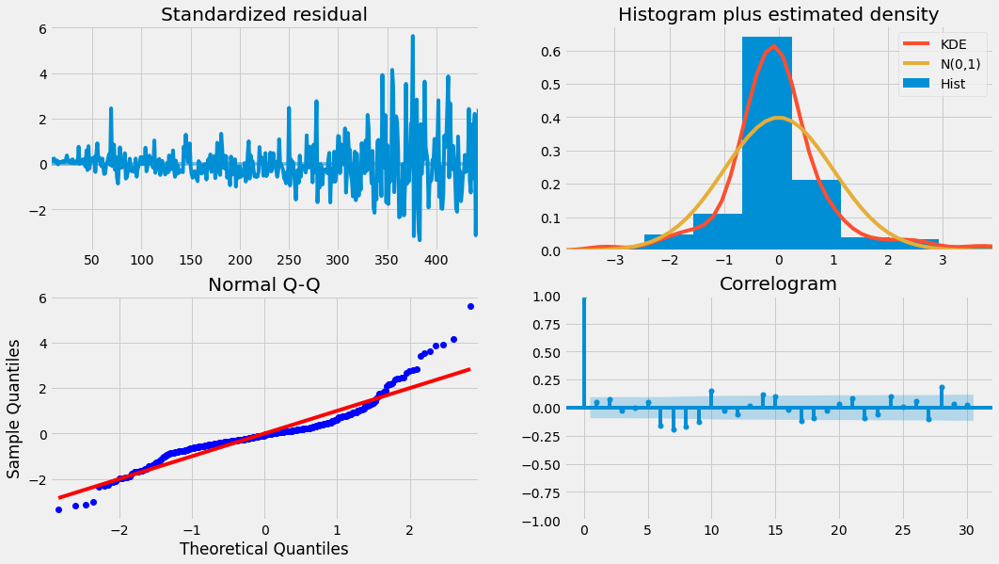

In [13]:
from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.ar_model import AutoReg, ar_select_order

def ar(lags, dynamic=False, method = "AR"):


    model = AutoReg(train[time_dependent_variable], lags=lags, trend= trend)
    
    fit1 = model.fit()
    diagnostic_plot(fit1, lags= 30)
    
    y_hat[method] = fit1.predict(start=len(train), end=len(train)+len(test)-1, dynamic=dynamic)
    
    return metrics
ar(lags= 7)

### Autoregressive Model with Seasonality = True

we have to specify the number of periods as well

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:               Seas. AutoReg(7)   Log Likelihood               -1803.493
Method:               Conditional MLE   S.D. of innovations             15.000
Date:                Sat, 09 Oct 2021   AIC                              5.489
Time:                        09:49:55   BIC                              5.639
Sample:                             7   HQIC                             5.548
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    -10.2254      2.681     -3.814      0.000     -15.481      -4.970
trend          0.0360      0.015      2.446      0.014       0.007       0.065
seasonal.1     2.0775      3.054      0.680      0.4

18.733310866265196

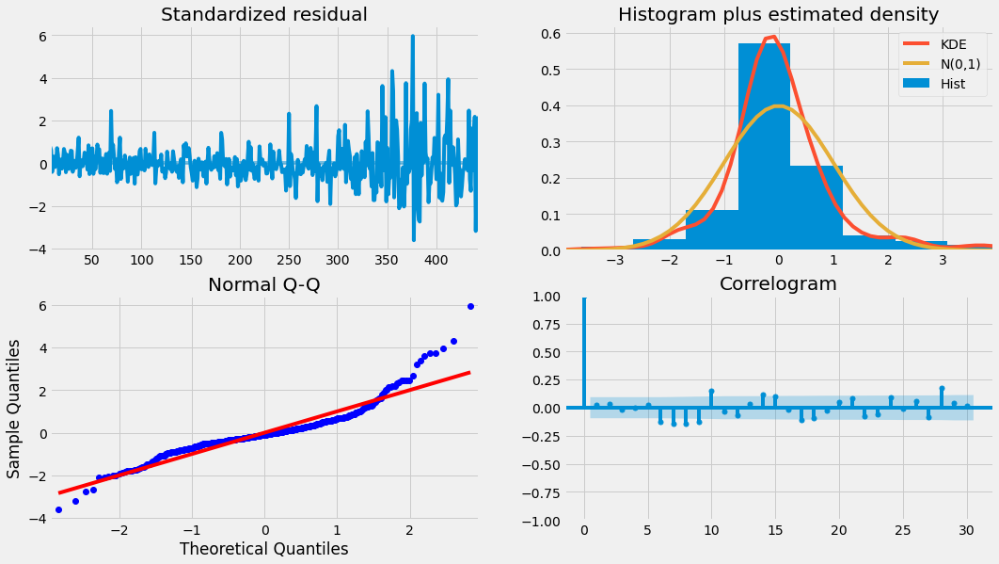

In [15]:
from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.ar_model import AutoReg, ar_select_order

def ar_seasonal(lags , seasonal=True, period = 7 , method = "AR"):


    model = AutoReg(train[time_dependent_variable], lags=lags, trend= trend, seasonal=seasonal, period = period)
    
    fit1 = model.fit()
    diagnostic_plot(fit1, lags= 30)
    
    y_hat[method] = fit1.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
    
    
    return metrics_(method)
ar_seasonal(lags= 7)

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:               Seas. AutoReg(0)   Log Likelihood               -2045.879
Method:               Conditional MLE   S.D. of innovations             24.262
Date:                Sat, 09 Oct 2021   AIC                              6.418
Time:                        09:49:56   BIC                              6.501
Sample:                             0   HQIC                             6.451
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    -37.0007      3.627    -10.201      0.000     -44.110     -29.891
trend          0.3210      0.009     35.727      0.000       0.303       0.339
seasonal.1    -3.2988      4.289     -0.769      0.4

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:               Seas. AutoReg(5)   Log Likelihood               -1879.435
Method:               Conditional MLE   S.D. of innovations             17.501
Date:                Sat, 09 Oct 2021   AIC                              5.788
Time:                        09:49:56   BIC                              5.919
Sample:                             5   HQIC                             5.840
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    -24.8314      2.791     -8.898      0.000     -30.301     -19.362
trend          0.0810      0.017      4.906      0.000       0.049       0.113
seasonal.1    10.2662      3.309      3.103      0.0

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:               Seas. AutoReg(8)   Log Likelihood               -1798.299
Method:               Conditional MLE   S.D. of innovations             14.963
Date:                Sat, 09 Oct 2021   AIC                              5.489
Time:                        09:49:57   BIC                              5.648
Sample:                             8   HQIC                             5.552
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    -10.3183      2.724     -3.787      0.000     -15.658      -4.978
trend          0.0390      0.015      2.634      0.008       0.010       0.068
seasonal.1     1.8085      3.079      0.587      0.5

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:              Seas. AutoReg(11)   Log Likelihood               -1780.613
Method:               Conditional MLE   S.D. of innovations             14.781
Date:                Sat, 09 Oct 2021   AIC                              5.479
Time:                        09:49:57   BIC                              5.667
Sample:                            11   HQIC                             5.553
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -9.9384      2.711     -3.666      0.000     -15.252      -4.625
trend          0.0404      0.015      2.695      0.007       0.011       0.070
seasonal.1     1.2183      3.073      0.396      0.6

AR(13,) metric=17.903
                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:              Seas. AutoReg(14)   Log Likelihood               -1741.661
Method:               Conditional MLE   S.D. of innovations             13.894
Date:                Sat, 09 Oct 2021   AIC                              5.370
Time:                        09:49:57   BIC                              5.587
Sample:                            14   HQIC                             5.456
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -6.0147      2.623     -2.293      0.022     -11.156      -0.874
trend          0.0275      0.014      1.908      0.056      -0.001       0.056
seasonal.1    -1.1239      2.9

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:              Seas. AutoReg(16)   Log Likelihood               -1731.376
Method:               Conditional MLE   S.D. of innovations             13.823
Date:                Sat, 09 Oct 2021   AIC                              5.369
Time:                        09:49:57   BIC                              5.607
Sample:                            16   HQIC                             5.463
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -6.3896      2.663     -2.399      0.016     -11.609      -1.170
trend          0.0289      0.014      1.997      0.046       0.001       0.057
seasonal.1    -0.7246      2.983     -0.243      0.8

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:              Seas. AutoReg(19)   Log Likelihood               -1715.887
Method:               Conditional MLE   S.D. of innovations             13.714
Date:                Sat, 09 Oct 2021   AIC                              5.369
Time:                        09:49:57   BIC                              5.636
Sample:                            19   HQIC                             5.474
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -6.8576      2.661     -2.577      0.010     -12.073      -1.642
trend          0.0283      0.015      1.945      0.052      -0.000       0.057
seasonal.1    -0.2393      2.968     -0.081      0.9

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:              Seas. AutoReg(21)   Log Likelihood               -1701.992
Method:               Conditional MLE   S.D. of innovations             13.527
Date:                Sat, 09 Oct 2021   AIC                              5.351
Time:                        09:49:58   BIC                              5.638
Sample:                            21   HQIC                             5.465
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -5.6547      2.662     -2.124      0.034     -10.873      -0.437
trend          0.0262      0.015      1.806      0.071      -0.002       0.055
seasonal.1    -0.7333      2.984     -0.246      0.8

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:              Seas. AutoReg(24)   Log Likelihood               -1687.172
Method:               Conditional MLE   S.D. of innovations             13.439
Date:                Sat, 09 Oct 2021   AIC                              5.353
Time:                        09:49:58   BIC                              5.671
Sample:                            24   HQIC                             5.479
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -5.4111      2.707     -1.999      0.046     -10.718      -0.105
trend          0.0265      0.015      1.814      0.070      -0.002       0.055
seasonal.1    -1.1058      3.009     -0.367      0.7

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:              Seas. AutoReg(27)   Log Likelihood               -1675.133
Method:               Conditional MLE   S.D. of innovations             13.439
Date:                Sat, 09 Oct 2021   AIC                              5.369
Time:                        09:49:58   BIC                              5.717
Sample:                            27   HQIC                             5.507
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -5.6626      2.740     -2.067      0.039     -11.033      -0.292
trend          0.0270      0.015      1.821      0.069      -0.002       0.056
seasonal.1    -0.9978      3.044     -0.328      0.7

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:              Seas. AutoReg(30)   Log Likelihood               -1655.522
Method:               Conditional MLE   S.D. of innovations             13.196
Date:                Sat, 09 Oct 2021   AIC                              5.348
Time:                        09:49:58   BIC                              5.727
Sample:                            30   HQIC                             5.498
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -5.6397      2.755     -2.047      0.041     -11.039      -0.240
trend          0.0273      0.015      1.854      0.064      -0.002       0.056
seasonal.1    -0.1232      3.038     -0.041      0.9

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:              Seas. AutoReg(32)   Log Likelihood               -1647.382
Method:               Conditional MLE   S.D. of innovations             13.191
Date:                Sat, 09 Oct 2021   AIC                              5.358
Time:                        09:49:59   BIC                              5.758
Sample:                            32   HQIC                             5.516
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -5.5974      2.767     -2.023      0.043     -11.020      -0.174
trend          0.0274      0.015      1.842      0.065      -0.002       0.056
seasonal.1     0.0131      3.047      0.004      0.9

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:              Seas. AutoReg(35)   Log Likelihood               -1636.181
Method:               Conditional MLE   S.D. of innovations             13.217
Date:                Sat, 09 Oct 2021   AIC                              5.378
Time:                        09:49:59   BIC                              5.810
Sample:                            35   HQIC                             5.549
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -5.6332      2.799     -2.012      0.044     -11.120      -0.146
trend          0.0272      0.015      1.803      0.071      -0.002       0.057
seasonal.1     0.3123      3.082      0.101      0.9

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:              Seas. AutoReg(38)   Log Likelihood               -1623.866
Method:               Conditional MLE   S.D. of innovations             13.207
Date:                Sat, 09 Oct 2021   AIC                              5.393
Time:                        09:49:59   BIC                              5.857
Sample:                            38   HQIC                             5.577
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -5.9299      2.863     -2.071      0.038     -11.541      -0.319
trend          0.0287      0.015      1.877      0.061      -0.001       0.059
seasonal.1    -0.0483      3.125     -0.015      0.9

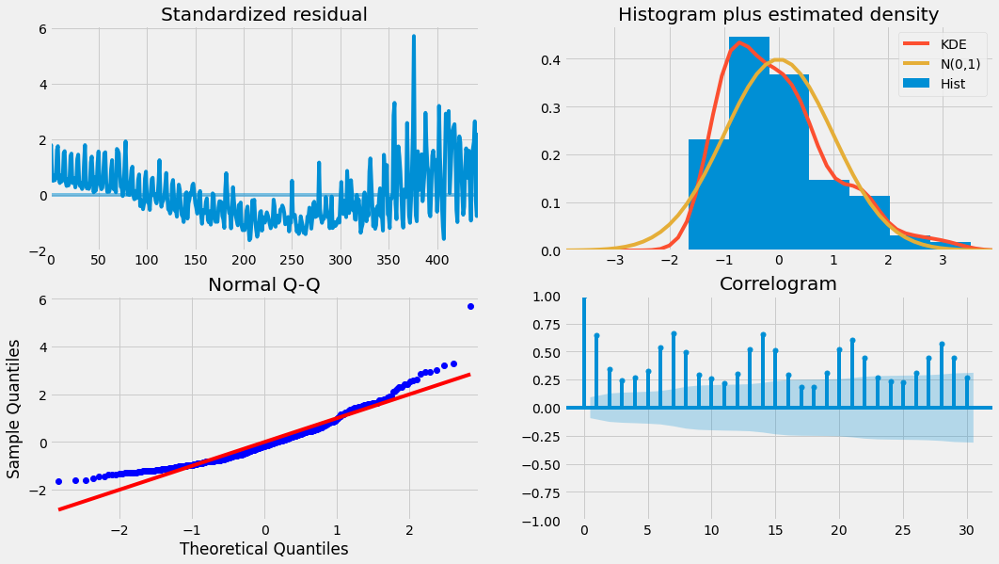

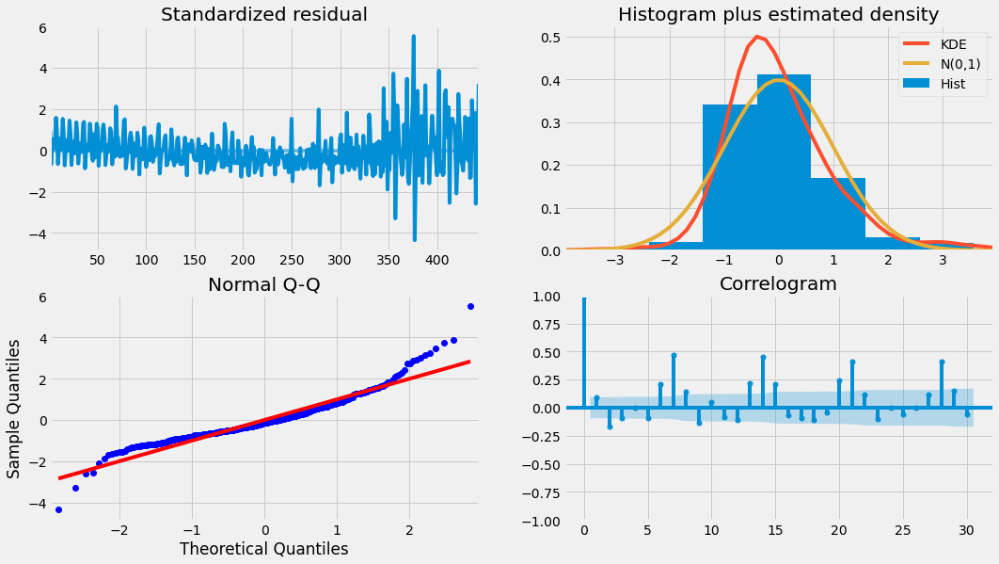

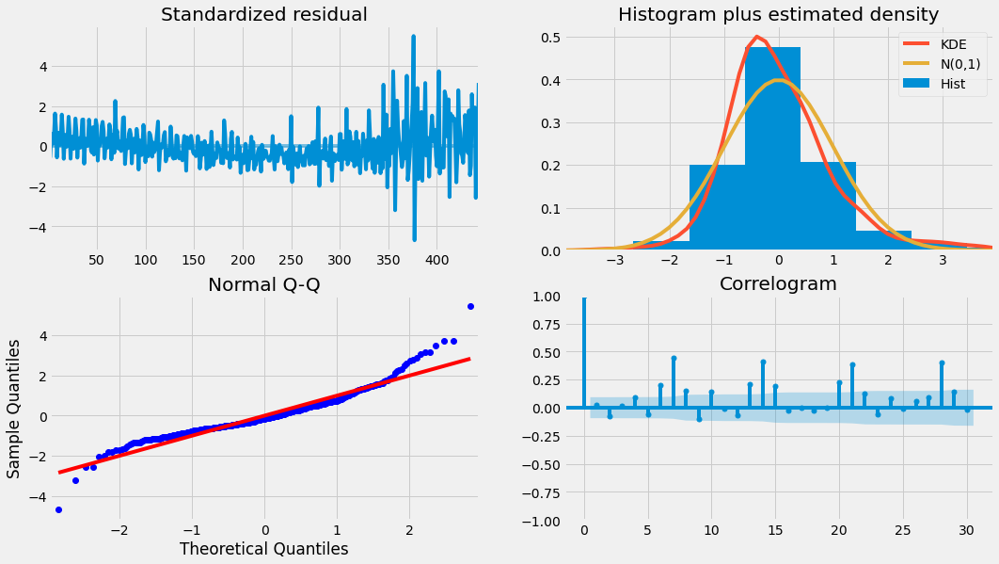

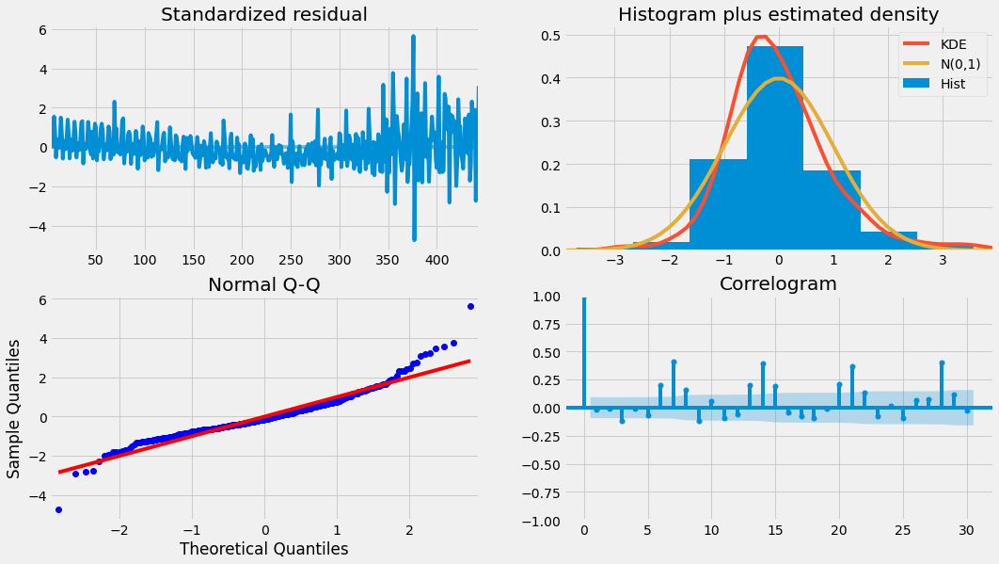

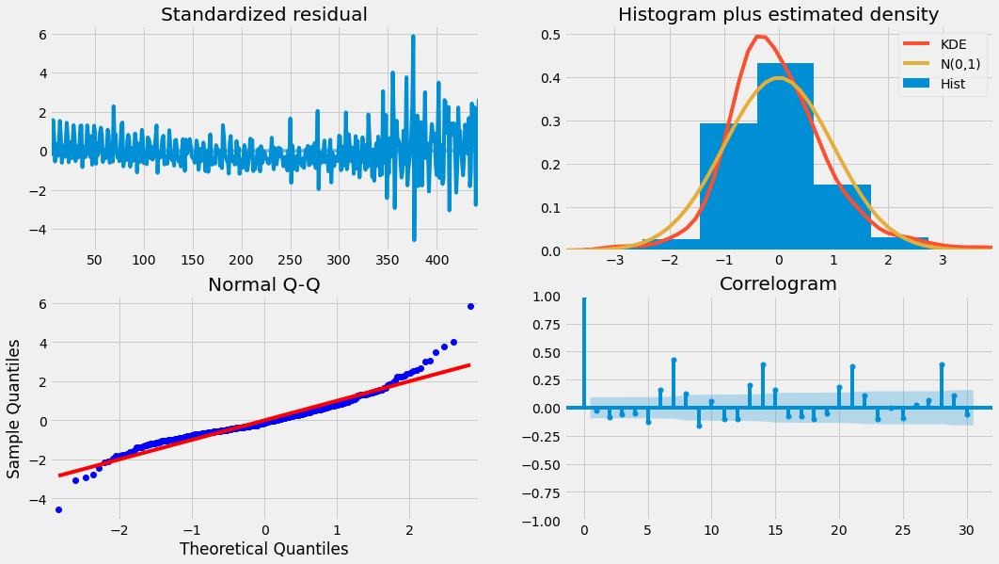

...

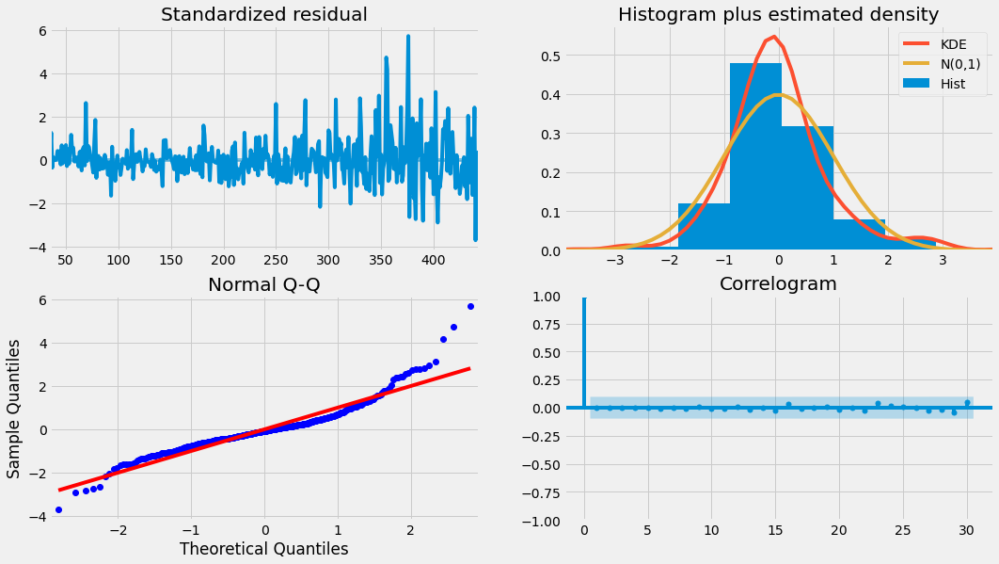

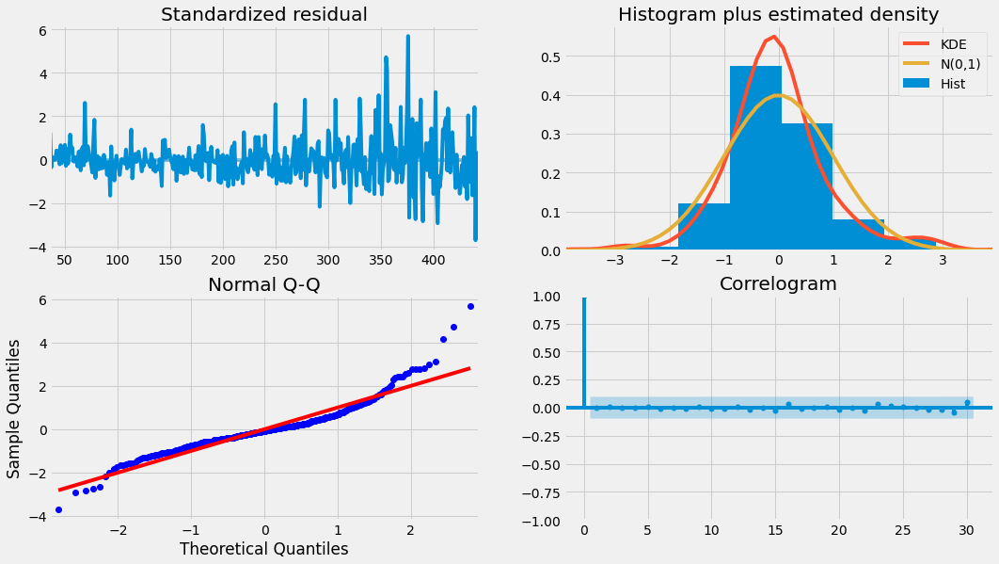

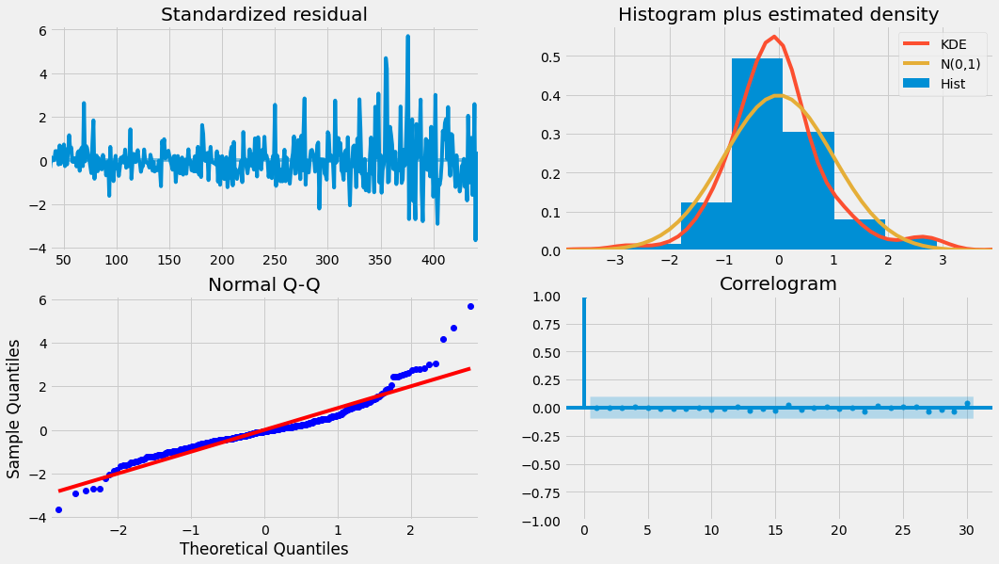

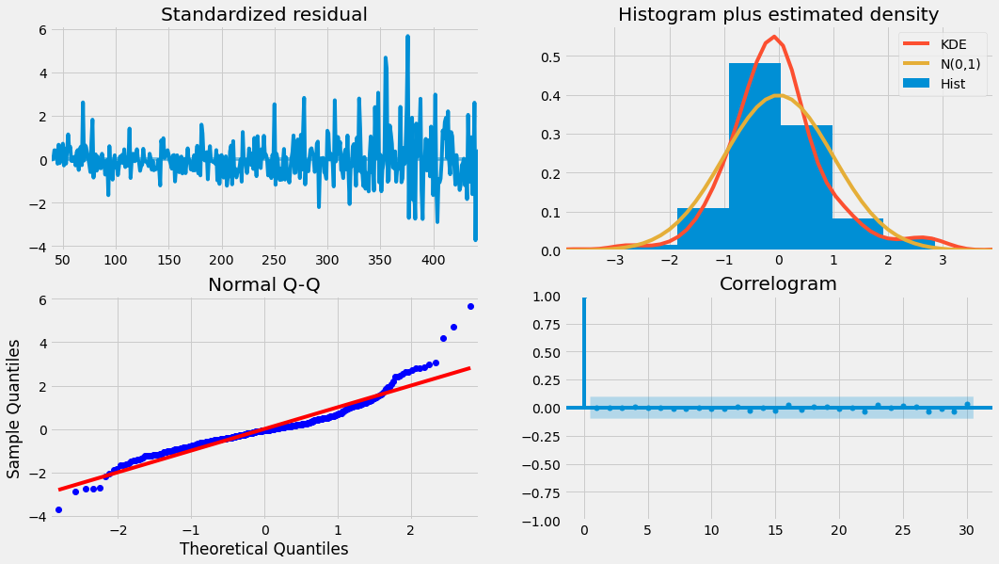

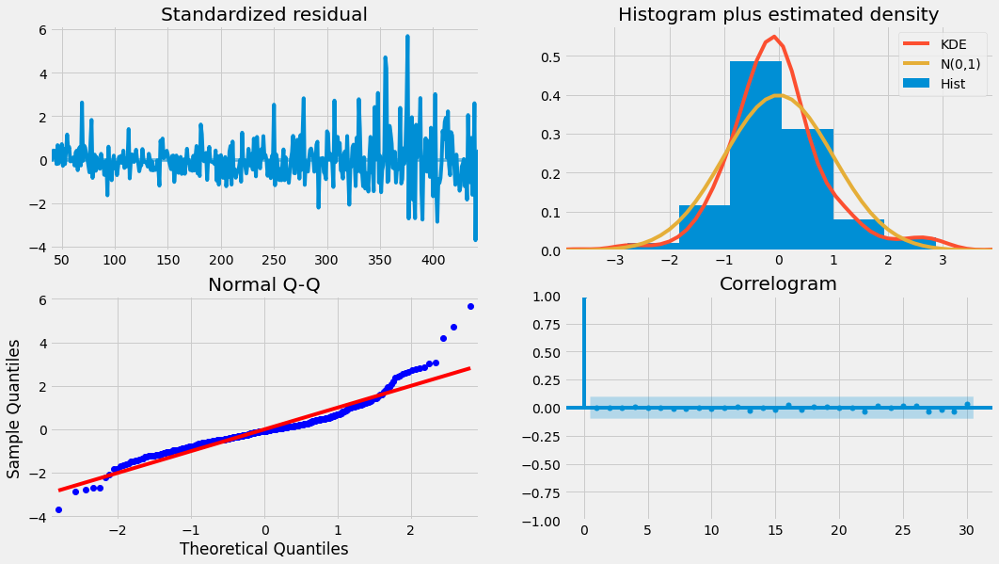

In [16]:
def ar_best_params( p_values=range(40)):
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        order = (p,)
        try:
            metric = ar(*order)
            if metric < best_score:
                best_score, best_cfg = metric, order
            print('AR%s metric=%.3f' % (order,metric))
        except:
            continue
    print('Best AR%s metric=%.3f' % (best_cfg, best_score))
    return best_cfg
    
best_cfg = ar_best_params()

                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:              Seas. AutoReg(22)   Log Likelihood               -1697.857
Method:               Conditional MLE   S.D. of innovations             13.523
Date:                Sat, 09 Oct 2021   AIC                              5.356
Time:                        09:50:19   BIC                              5.653
Sample:                            22   HQIC                             5.473
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -5.7578      2.712     -2.123      0.034     -11.073      -0.443
trend          0.0268      0.015      1.843      0.065      -0.002       0.055
seasonal.1    -0.7418      3.005     -0.247      0.8

16.150258873232147

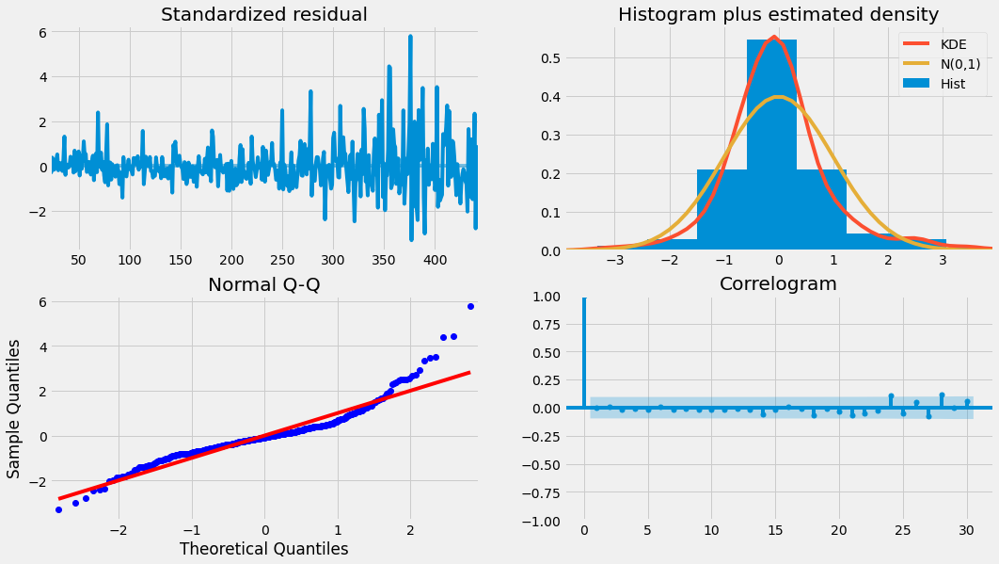

In [17]:
ar(*best_cfg)

In [18]:
y_hat.head()

,Datetime,ID,Count,simple_avg,AR
444,2013-11-12,10667.5,135.916667,50.548986,184.595686
445,2013-11-13,10691.5,178.083333,50.548986,166.295797
446,2013-11-14,10715.5,165.916667,50.548986,170.870346
447,2013-11-15,10739.5,120.833333,50.548986,139.664710
448,2013-11-16,10763.5,80.333333,50.548986,97.907517


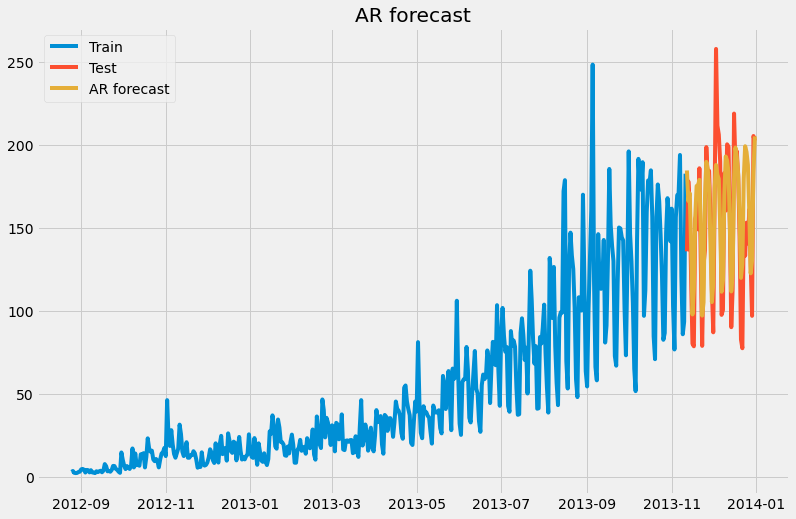

Evaluation metric results:-
MSE is : 723.7252187055797
MAE is : 21.25048620437066
MAPE is : 16.150258873232147
R2 is : 0.617213552405933
RMSE is : 26.902141526383726



In [19]:
plot(method= 'AR' )

# AR with ar_select_order

https://www.statsmodels.org/stable/examples/notebooks/generated/autoregressions.html

This cell sets the plotting style, registers pandas date converters for matplotlib
Also, we set the frequency for the time series to “D” (daily) to avoid warnings when using AutoReg.

In [20]:
pd.plotting.register_matplotlib_converters()


                            AutoReg Model Results                             
Dep. Variable:                  Count   No. Observations:                  444
Model:              Restr. AutoReg(7)   Log Likelihood               -1823.923
Method:               Conditional MLE   S.D. of innovations             15.718
Date:                Sat, 09 Oct 2021   AIC                              5.551
Time:                        09:50:20   BIC                              5.635
Sample:                             7   HQIC                             5.584
                                  444                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.3433      1.832     -1.279      0.201      -5.935       1.248
trend          0.0392      0.015      2.558      0.011       0.009       0.069
Count.L1       0.4800      0.043     11.215      0.0

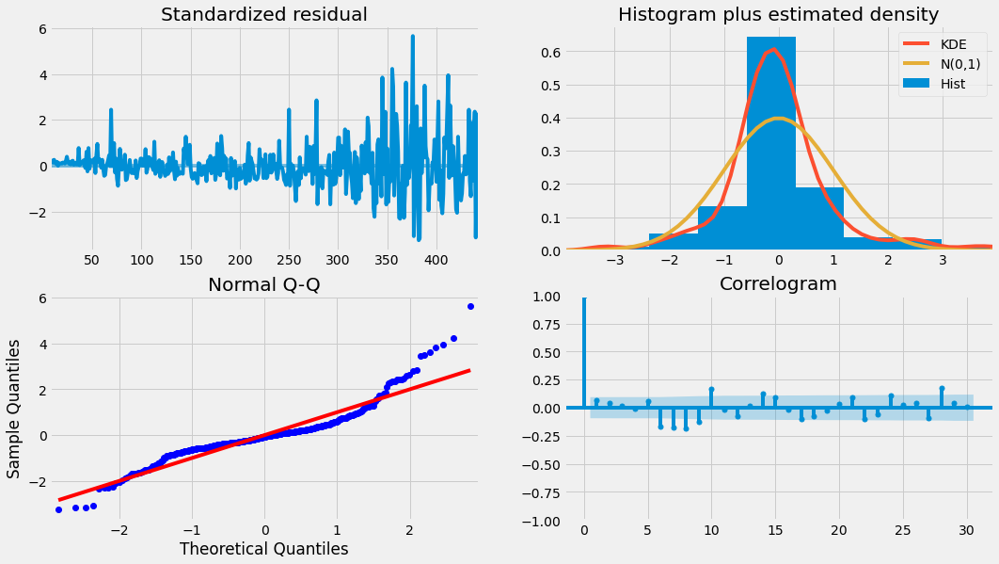

In [21]:
def autoreg_select_order(method= "AutoReg"):
    sel = ar_select_order(train[time_dependent_variable],     maxlag= 7,
        ic='aic',
        glob=True,
        trend='ct',
        seasonal=False, old_names=False)
    
    res = sel.model.fit()
    diagnostic_plot(res)
    y_hat[method]= res.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
autoreg_select_order(method= "AutoReg")

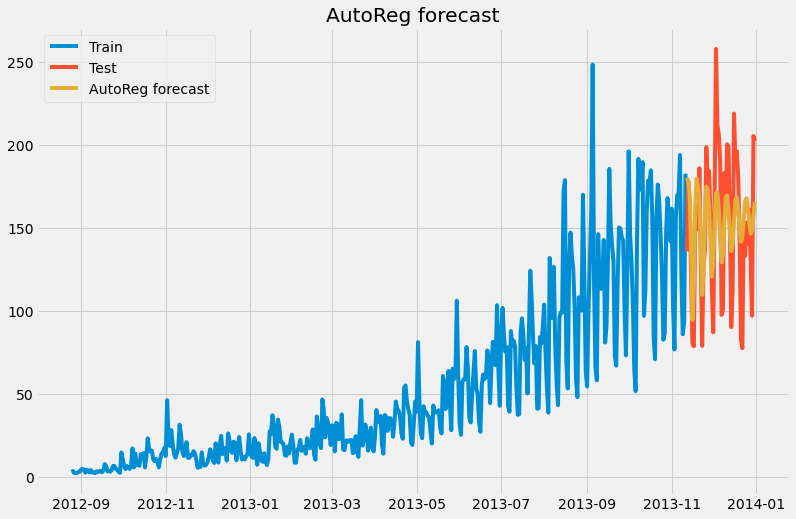

Evaluation metric results:-
MSE is : 1075.6481086452113
MAE is : 27.025929715361414
MAPE is : 20.245645768065373
R2 is : 0.4310775585435558
RMSE is : 32.79707469646053



In [22]:
plot(method= "AutoReg")

# AR with pmdarima library

Performing stepwise search to minimize aic
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=3998.063, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4187.853, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=3972.334, Time=0.05 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=3955.626, Time=0.18 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=3957.585, Time=0.54 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=3955.626, Time=0.20 sec

Best model:  ARIMA(3,0,0)(0,0,0)[0]          
Total fit time: 1.134 seconds





Auto_AR Model Summary is : 
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  444
Model:               SARIMAX(3, 0, 0)   Log Likelihood               -1971.813
Date:                Sat, 09 Oct 2021   AIC                           3955.626
Time:                        09:50:22   BIC                           3980.201
Sample:                             0   HQIC            

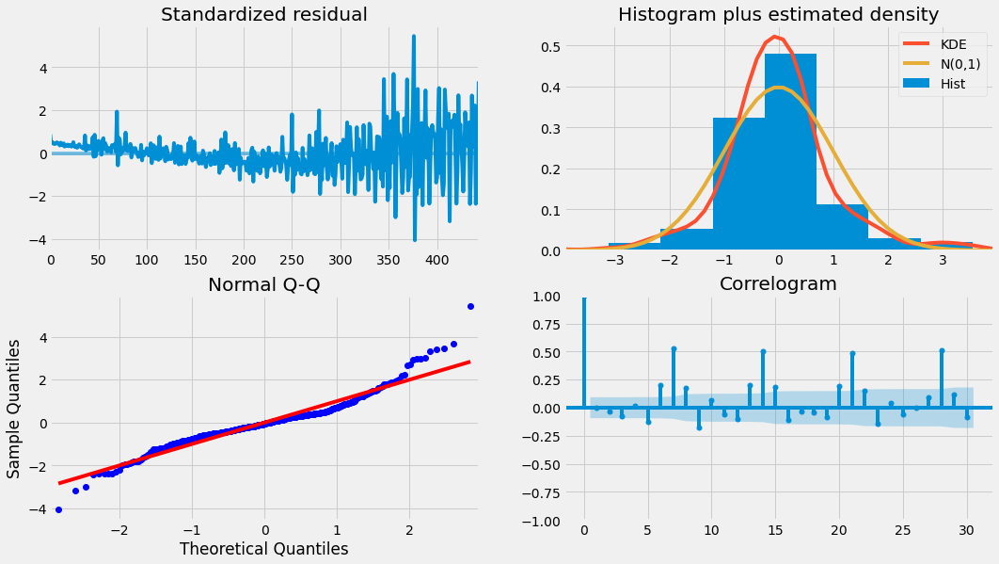

In [23]:
def auto_ar(max_p = 7, method = "Auto_AR"):
    model = pmd.auto_arima(train[time_dependent_variable], 
                          start_p=1, 
                          start_q=0,
                          d = 0,
                           max_p = max_p, max_q=0, 
                           trend = trend, seasonal=False,
                           trace=True,error_action='ignore',
                          suppress_warnings=True,stepwise=True)

    
    
    print("\n\n\n\n")
    print(method+" Model Summary is : ")
    print(model.summary())
    print("\n\n\n\n")
    
    y_hat.loc[:,method] = model.predict(len(test))

    print("Test Dataset After Forecast: ")
    print(y_hat.head(5))
    print("\n\n\n\n")
    diagnostic_plot(model)
    

    
    print(metrics_(method))
    
auto_ar()

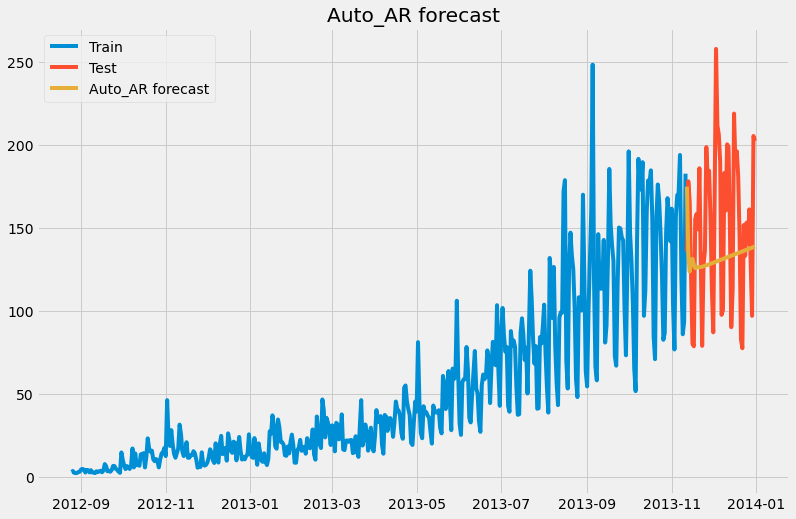

Evaluation metric results:-
MSE is : 2340.501692461572
MAE is : 41.16832955659635
MAPE is : 28.05755743025443
R2 is : -0.237917797099364
RMSE is : 48.37873181948419



In [24]:
plot(method = "Auto_AR")

# MA

In [25]:
def ma(MA, method = "MA"):
    global y_hat
    model = ARMA(train[time_dependent_variable], order=(0, MA))
    
    fit1 = model.fit(disp=False)
    
    y_hat[method] = fit1.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
    
    return metrics_(method)
    
ma(MA = 5, method = "MA")



57.79851153634845

In [26]:
def ma_best_params(q_values=range(7)):
    best_score, best_cfg = float("inf"), None
#for m in [1, 4,7,12,52]:

    for q in q_values:
        order = (q, )
        try:
            metric = ma(*order)
            if metric < best_score:
                best_score, best_cfg = metric, order
            print('MA%s metric=%.3f' % (order,metric))
        except:
            continue
    print('Best MA%s metric=%.3f' % (best_cfg, best_score))
    return best_cfg
    
best_cfg = ma_best_params()

MA(0,) metric=63.324
MA(1,) metric=62.034
MA(2,) metric=61.590
MA(3,) metric=61.498
MA(4,) metric=59.092
MA(5,) metric=57.799
MA(6,) metric=58.477
Best MA(5,) metric=57.799


In [27]:
ma(*best_cfg)

57.79851153634845

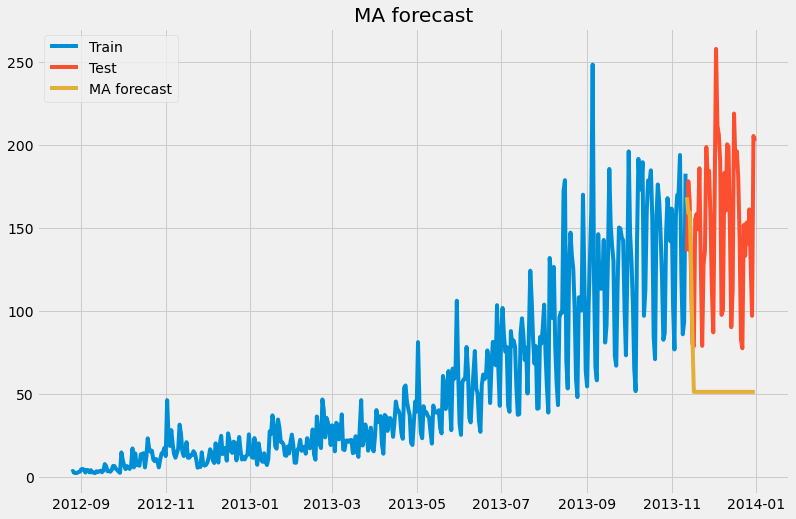

Evaluation metric results:-
MSE is : 11192.598049478682
MAE is : 93.42170856615574
MAPE is : 57.79851153634845
R2 is : -4.919891605229752
RMSE is : 105.79507573360247



In [28]:
plot(method = "MA")

# MA with pmdarima library

In [29]:
def auto_ma(max_q = 40, method = "Auto_MA"):
    model = pmd.auto_arima(train[time_dependent_variable], 
                          start_p=0, 
                          start_q=7,
                          d = 0,
                           max_p = 0, max_q=max_q, seasonal=False,trend = trend,
                            trace=True,error_action='ignore',
                          suppress_warnings=True,stepwise=True)

    
    
    print("\n\n\n\n")
    print(method+" Model Summary is : ")
    print(model.summary())
    print("\n\n\n\n")
    
    y_hat.loc[:,method] = model.predict(len(test))

    print("Test Dataset After Forecast: ")
    print(y_hat.head(5))
    print("\n\n\n\n")
#     arima_model.plot_diagnostics()
    

    print(metrics_(method))
    
auto_ma()

Performing stepwise search to minimize aic
 ARIMA(0,0,7)(0,0,0)[0]             : AIC=3884.841, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4187.853, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=3983.035, Time=0.41 sec
 ARIMA(0,0,6)(0,0,0)[0]             : AIC=3932.553, Time=0.79 sec
 ARIMA(0,0,8)(0,0,0)[0]             : AIC=3821.135, Time=1.13 sec
 ARIMA(0,0,9)(0,0,0)[0]             : AIC=3817.816, Time=1.09 sec
 ARIMA(0,0,10)(0,0,0)[0]             : AIC=3819.695, Time=1.29 sec
 ARIMA(0,0,9)(0,0,0)[0] intercept   : AIC=3817.816, Time=1.23 sec

Best model:  ARIMA(0,0,9)(0,0,0)[0]          
Total fit time: 6.909 seconds





Auto_MA Model Summary is : 
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  444
Model:               SARIMAX(0, 0, 9)   Log Likelihood               -1896.908
Date:                Sat, 09 Oct 2021   AIC                           3817.816
Ti

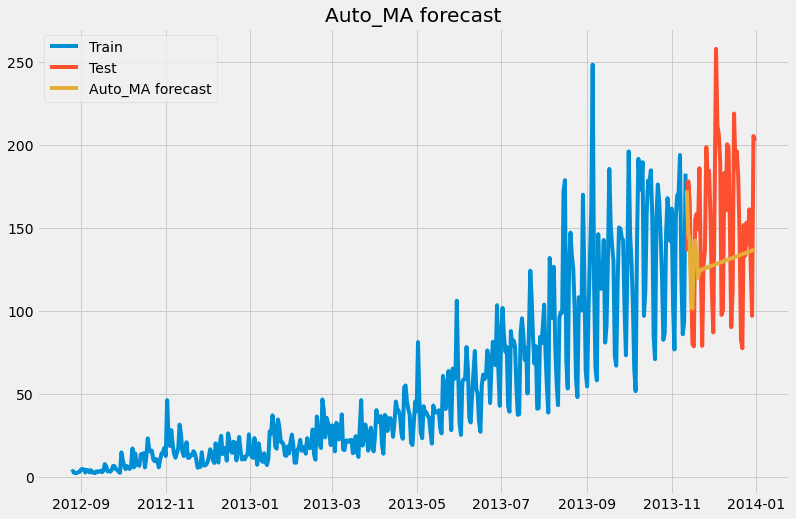

Evaluation metric results:-
MSE is : 2318.0023624104188
MAE is : 40.33167390231595
MAPE is : 27.11730811870498
R2 is : -0.22601764715166528
RMSE is : 48.14563700285228



In [30]:
plot(method = "Auto_MA")

# ARMA

In [31]:
def arma(AR,MA, method = "ARMA"):
    global y_hat
    model = ARMA(train[time_dependent_variable], order=(AR,MA))
    
    fit1 = model.fit(disp=False)
    print(fit1.summary())
    
    y_hat[method] = fit1.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
     
    return metrics_(method)
    
arma(AR= 1,MA = 1, method = "ARMA")

                              ARMA Model Results                              
Dep. Variable:                  Count   No. Observations:                  444
Model:                     ARMA(1, 1)   Log Likelihood               -2029.775
Method:                       css-mle   S.D. of innovations             23.356
Date:                Sat, 09 Oct 2021   AIC                           4067.550
Time:                        09:50:32   BIC                           4083.933
Sample:                             0   HQIC                          4074.011
                                                                              
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const          51.7242      7.988      6.475      0.000      36.067      67.381
ar.L1.Count     0.8319      0.034     24.568      0.000       0.766       0.898
ma.L1.Count     0.2247      0.078      2.880    

55.05689171048465

In [32]:
def arma_best_params(p_values=range(7), q_values=range(7)):
    best_score, best_cfg = float("inf"), None
#for m in [1, 4,7,12,52]:
    for p in p_values:
        for q in q_values:
            order = (p, q)
            try:
                metric = arma(*order)
                if metric < best_score:
                    best_score, best_cfg = metric, order
                print('ARMA%s metric=%.3f' % (order,metric))
            except:
                continue
    print('Best ARMA%s metric=%.3f' % (best_cfg, best_score))
    return best_cfg
    
best_cfg = arma_best_params()

                              ARMA Model Results                              
Dep. Variable:                  Count   No. Observations:                  444
Model:                     ARMA(0, 0)   Log Likelihood               -2359.274
Method:                           css   S.D. of innovations             49.143
Date:                Sat, 09 Oct 2021   AIC                           4722.549
Time:                        09:50:32   BIC                           4730.740
Sample:                             0   HQIC                          4725.779
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         50.5490      2.332     21.674      0.000      45.978      55.120
ARMA(0, 0) metric=63.324
                              ARMA Model Results                              
Dep. Variable:             

                              ARMA Model Results                              
Dep. Variable:                  Count   No. Observations:                  444
Model:                     ARMA(0, 5)   Log Likelihood               -2026.332
Method:                       css-mle   S.D. of innovations             23.153
Date:                Sat, 09 Oct 2021   AIC                           4066.663
Time:                        09:50:33   BIC                           4095.334
Sample:                             0   HQIC                          4077.970
                                                                              
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const          51.3149      5.763      8.905      0.000      40.020      62.610
ma.L1.Count     1.1907      0.043     27.676      0.000       1.106       1.275
ma.L2.Count     1.0694      0.067     16.002    

                              ARMA Model Results                              
Dep. Variable:                  Count   No. Observations:                  444
Model:                     ARMA(1, 3)   Log Likelihood               -1954.978
Method:                       css-mle   S.D. of innovations             19.685
Date:                Sat, 09 Oct 2021   AIC                           3921.956
Time:                        09:50:35   BIC                           3946.531
Sample:                             0   HQIC                          3931.647
                                                                              
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const          69.5675     60.298      1.154      0.249     -48.614     187.749
ar.L1.Count     0.9993      0.001   1094.506      0.000       0.998       1.001
ma.L1.Count    -0.2869      0.060     -4.783    

                              ARMA Model Results                              
Dep. Variable:                  Count   No. Observations:                  444
Model:                     ARMA(2, 1)   Log Likelihood               -1988.304
Method:                       css-mle   S.D. of innovations             20.988
Date:                Sat, 09 Oct 2021   AIC                           3986.607
Time:                        09:50:38   BIC                           4007.086
Sample:                             0   HQIC                          3994.683
                                                                              
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const          51.2092        nan        nan        nan         nan         nan
ar.L1.Count     1.4148   1.21e-05   1.17e+05      0.000       1.415       1.415
ar.L2.Count    -0.4148   3.55e-06  -1.17e+05    

                              ARMA Model Results                              
Dep. Variable:                  Count   No. Observations:                  444
Model:                     ARMA(2, 5)   Log Likelihood               -1925.358
Method:                       css-mle   S.D. of innovations             18.390
Date:                Sat, 09 Oct 2021   AIC                           3868.716
Time:                        09:50:42   BIC                           3905.578
Sample:                             0   HQIC                          3883.253
                                                                              
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const          68.9764     59.435      1.161      0.246     -47.515     185.467
ar.L1.Count     0.5463      0.116      4.716      0.000       0.319       0.773
ar.L2.Count     0.4526      0.116      3.909    

                              ARMA Model Results                              
Dep. Variable:                  Count   No. Observations:                  444
Model:                     ARMA(3, 2)   Log Likelihood               -1935.062
Method:                       css-mle   S.D. of innovations             18.581
Date:                Sat, 09 Oct 2021   AIC                           3884.124
Time:                        09:50:55   BIC                           3912.794
Sample:                             0   HQIC                          3895.430
                                                                              
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const          50.8789        nan        nan        nan         nan         nan
ar.L1.Count     1.9661   3.68e-05   5.34e+04      0.000       1.966       1.966
ar.L2.Count    -1.5897   3.21e-05  -4.95e+04    

                              ARMA Model Results                              
Dep. Variable:                  Count   No. Observations:                  444
Model:                     ARMA(4, 0)   Log Likelihood               -1997.411
Method:                       css-mle   S.D. of innovations             21.702
Date:                Sat, 09 Oct 2021   AIC                           4006.823
Time:                        09:51:02   BIC                           4031.398
Sample:                             0   HQIC                          4016.514
                                                                              
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const          52.9385     14.884      3.557      0.000      23.766      82.111
ar.L1.Count     0.9132      0.048     19.127      0.000       0.820       1.007
ar.L2.Count    -0.3530      0.064     -5.535    

                              ARMA Model Results                              
Dep. Variable:                  Count   No. Observations:                  444
Model:                     ARMA(4, 4)   Log Likelihood               -1932.093
Method:                       css-mle   S.D. of innovations             18.461
Date:                Sat, 09 Oct 2021   AIC                           3884.186
Time:                        09:51:17   BIC                           3925.145
Sample:                             0   HQIC                          3900.338
                                                                              
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const          50.9867        nan        nan        nan         nan         nan
ar.L1.Count     0.8778   9.66e-06   9.09e+04      0.000       0.878       0.878
ar.L2.Count     0.4598        nan        nan    

                              ARMA Model Results                              
Dep. Variable:                  Count   No. Observations:                  444
Model:                     ARMA(5, 2)   Log Likelihood               -1891.906
Method:                       css-mle   S.D. of innovations             16.404
Date:                Sat, 09 Oct 2021   AIC                           3801.811
Time:                        09:51:24   BIC                           3838.673
Sample:                             0   HQIC                          3816.348
                                                                              
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const          50.6066        nan        nan        nan         nan         nan
ar.L1.Count     1.7953        nan        nan        nan         nan         nan
ar.L2.Count    -1.8275   5.83e-06  -3.14e+05    

                              ARMA Model Results                              
Dep. Variable:                  Count   No. Observations:                  444
Model:                     ARMA(6, 2)   Log Likelihood               -1863.293
Method:                       css-mle   S.D. of innovations             15.881
Date:                Sat, 09 Oct 2021   AIC                           3746.586
Time:                        09:51:31   BIC                           3787.544
Sample:                             0   HQIC                          3762.738
                                                                              
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const         679.9314        nan        nan        nan         nan         nan
ar.L1.Count     1.0942      0.001   1077.530      0.000       1.092       1.096
ar.L2.Count    -0.8065      0.001   -545.954    

In [33]:
arma(*best_cfg)

                              ARMA Model Results                              
Dep. Variable:                  Count   No. Observations:                  444
Model:                     ARMA(5, 2)   Log Likelihood               -1891.906
Method:                       css-mle   S.D. of innovations             16.404
Date:                Sat, 09 Oct 2021   AIC                           3801.811
Time:                        09:51:36   BIC                           3838.673
Sample:                             0   HQIC                          3816.348
                                                                              
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const          50.6066        nan        nan        nan         nan         nan
ar.L1.Count     1.7953        nan        nan        nan         nan         nan
ar.L2.Count    -1.8275   5.83e-06  -3.14e+05    

17.71707804348632

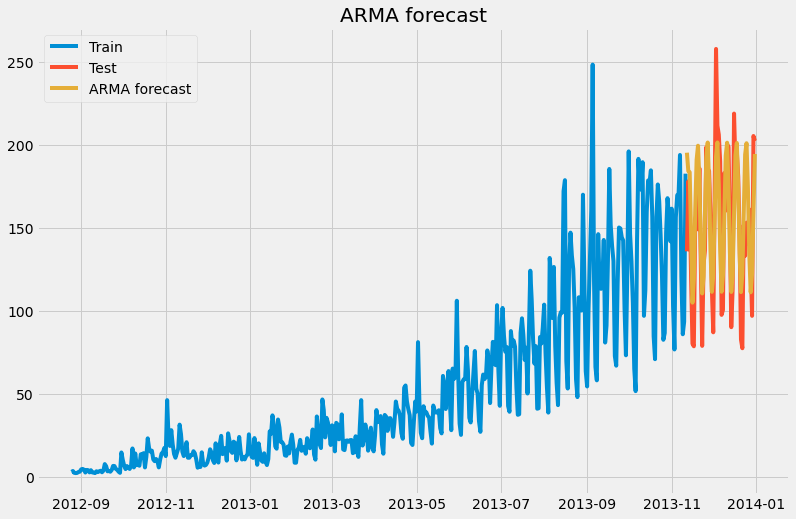

Evaluation metric results:-
MSE is : 871.3853815640902
MAE is : 23.835122823859457
MAPE is : 17.71707804348632
R2 is : 0.5391144234397437
RMSE is : 29.51923748276859



In [34]:
plot(method = "ARMA")

# ARMA with pmdarima

In [35]:
def auto_arma(max_p = 7, max_q= 7, method = "Auto_ARMA"):
    model = pmd.auto_arima(train[time_dependent_variable], 
                          start_p=7, 
                          start_q=1,
                           d = 0,
                           max_p = max_p, max_q = max_q,
                           seasonal=False, trend = trend,
                           trace=True,error_action='ignore',
                          suppress_warnings=True,stepwise=True)

    
    
    print("\n\n\n\n")
    print(method+" Model Summary is : ")
    print(model.summary())
    print("\n\n\n\n")
    
    y_hat.loc[:,method] = model.predict(len(test))

    print("Test Dataset After Forecast: ")
    print(y_hat.head(5))
    print("\n\n\n\n")
#     arima_model.plot_diagnostics()
    

    print(metrics_(method))
    
auto_arma()

Performing stepwise search to minimize aic
 ARIMA(7,0,1)(0,0,0)[0]             : AIC=3719.543, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4187.853, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=3998.063, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=3983.035, Time=0.31 sec
 ARIMA(6,0,1)(0,0,0)[0]             : AIC=3749.786, Time=0.75 sec
 ARIMA(7,0,0)(0,0,0)[0]             : AIC=3723.040, Time=0.87 sec
 ARIMA(7,0,2)(0,0,0)[0]             : AIC=3715.761, Time=0.92 sec
 ARIMA(6,0,2)(0,0,0)[0]             : AIC=3738.381, Time=0.81 sec
 ARIMA(7,0,3)(0,0,0)[0]             : AIC=3704.855, Time=1.14 sec
 ARIMA(6,0,3)(0,0,0)[0]             : AIC=3733.055, Time=0.90 sec
 ARIMA(7,0,4)(0,0,0)[0]             : AIC=3688.334, Time=1.70 sec
 ARIMA(6,0,4)(0,0,0)[0]             : AIC=3685.137, Time=1.34 sec
 ARIMA(5,0,4)(0,0,0)[0]             : AIC=3704.110, Time=1.17 sec
 ARIMA(6,0,5)(0,0,0)[0]             : AIC=3701.253, Time=1.28 sec
 ARIMA(5,0,3)(0,0,0)[0]          

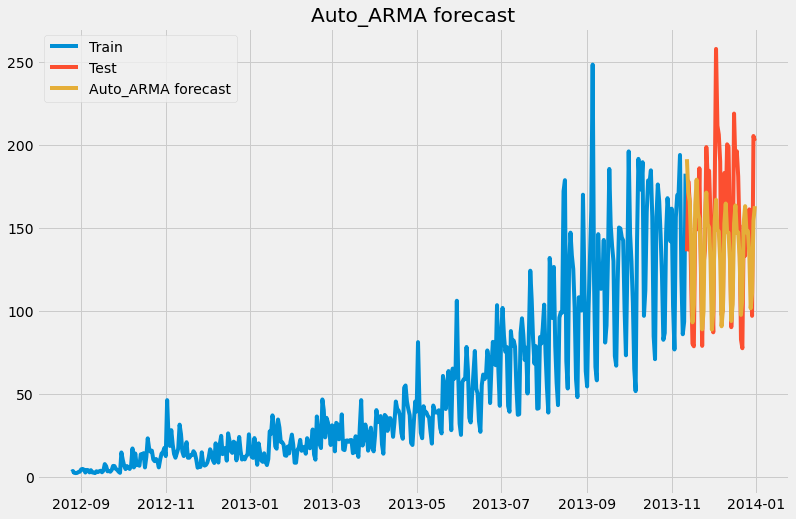

Evaluation metric results:-
MSE is : 1080.3301025459737
MAE is : 26.020272393317196
MAPE is : 16.406106819272715
R2 is : 0.428601199054335
RMSE is : 32.8683754168954



In [36]:
plot(method = "Auto_ARMA")

# ARIMA

In [39]:
def arima(p,d,q, method = "ARIMA" ):

    
    model = ARIMA(train[time_dependent_variable], exog=None, order=(p,d,q))
    fit1 = model.fit()
    
    y_hat[method] = fit1.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False, typ='levels')
    
    
    return metrics_(method)

arima(1, 1, 1)

28.509210310976318

In [40]:
def arima_best_params(p_values=range(7), d_values=range(2), q_values=range(7)):
    best_score, best_cfg = float("inf"), None
#for m in [1, 4,7,12,52]:
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p, d, q)
                try:
                    metric = arima(*order)
                    if metric < best_score:
                        best_score, best_cfg = metric, order
                    print('ARIMA%s metric=%.3f' % (order,metric))
                except:
                    continue
    print('Best ARIMA%s metric=%.3f' % (best_cfg, best_score))
    return best_cfg
    
best_cfg = arima_best_params()

ARIMA(0, 0, 0) metric=63.324
ARIMA(0, 0, 1) metric=62.034
ARIMA(0, 0, 2) metric=61.590
ARIMA(0, 0, 3) metric=61.498
ARIMA(0, 0, 4) metric=59.092
ARIMA(0, 0, 5) metric=57.799
ARIMA(0, 0, 6) metric=58.477
ARIMA(0, 1, 0) metric=42.424
ARIMA(0, 1, 1) metric=41.799
ARIMA(0, 1, 2) metric=28.912
ARIMA(0, 1, 3) metric=28.932
ARIMA(0, 1, 4) metric=28.798
ARIMA(0, 1, 6) metric=28.829
ARIMA(1, 0, 0) metric=52.418
ARIMA(1, 0, 1) metric=55.057
ARIMA(1, 0, 2) metric=27.798
ARIMA(1, 0, 3) metric=27.806
ARIMA(1, 0, 4) metric=27.901
ARIMA(1, 0, 5) metric=27.951
ARIMA(1, 0, 6) metric=28.036
ARIMA(1, 1, 0) metric=42.306
ARIMA(1, 1, 1) metric=28.509
ARIMA(1, 1, 2) metric=28.920
ARIMA(1, 1, 3) metric=28.629
ARIMA(1, 1, 4) metric=28.749
ARIMA(1, 1, 5) metric=28.695
ARIMA(1, 1, 6) metric=28.737
ARIMA(2, 0, 0) metric=53.384
ARIMA(2, 0, 1) metric=27.459
ARIMA(2, 0, 2) metric=27.811
ARIMA(2, 0, 3) metric=27.819
ARIMA(2, 0, 4) metric=27.885
ARIMA(2, 0, 5) metric=27.911
ARIMA(2, 0, 6) metric=26.837
ARIMA(2, 1, 0)

In [41]:
arima(*best_cfg)

17.333330087023832

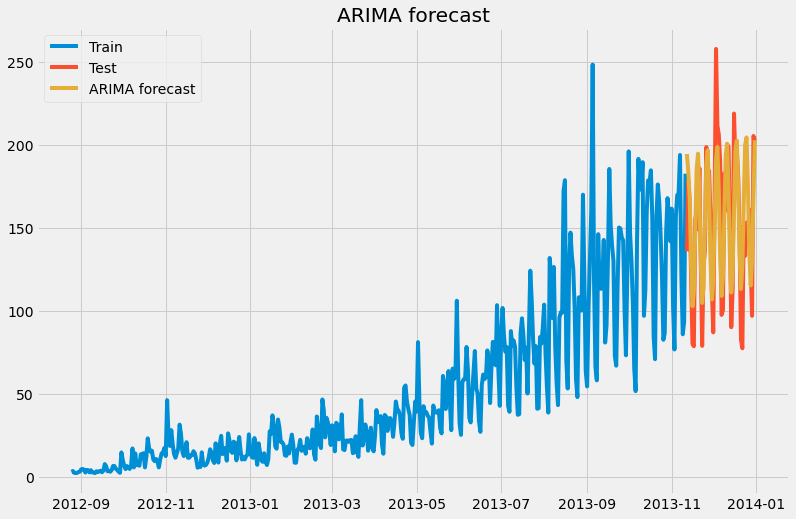

Evaluation metric results:-
MSE is : 861.93012499524
MAE is : 23.48728668683429
MAPE is : 17.333330087023832
R2 is : 0.5441154155007278
RMSE is : 29.35864651163674



In [42]:
plot(method= 'ARIMA' )

# ARIMA With PMDARIMA LIBRARY

• Pmdarima (for py + arima) is a statistical library designed to fill the void in Python’s time-series analysis capabilities, which is the equivalent of R’s auto.arima

In [43]:
import pmdarima as pmd

def arimamodel():
    autoarima_model = pmd.auto_arima(train[time_dependent_variable], 
                              start_p=1, 
                              start_q=1,
                               max_p=7, max_q=7, 
                              seasonal=False, trend = trend,
                               d=None, trace=True,error_action='ignore',
                              suppress_warnings=True,stepwise=True)
    return autoarima_model


In [44]:
def auto_arima(max_p= 7, max_q=7, method = "Auto_ARIMA"):
    model = pmd.auto_arima(train[time_dependent_variable], 
                          start_p=1, 
                          start_q=1,
                           max_p=max_p, max_q=max_q,
                           seasonal=False, 
                           d=None, trace=True,error_action='ignore',
                          suppress_warnings=True,stepwise=True)

    
    
    print("\n\n\n\n")
    print(method + " Model Summary is : ")
    print(model.summary())
    print("\n\n\n\n")
    
    y_hat.loc[:,method] = model.predict(len(test))

    print("Test Dataset After Forecast: ")
    print(y_hat.head(5))
    print("\n\n\n\n")
#     arima_model.plot_diagnostics()
    

    print(metrics_(method))
    
auto_arima()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3953.178, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4083.583, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4085.581, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4085.572, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4081.707, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3866.346, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4010.064, Time=0.10 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3866.441, Time=0.25 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3852.295, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3898.051, Time=0.18 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3869.023, Time=0.47 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3857.048, Time=0.45 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3879.980, Time=0.34 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=3850.425, Time=0.46 sec
 ARIMA(4,1,3)(0,0,0)[0] intercept

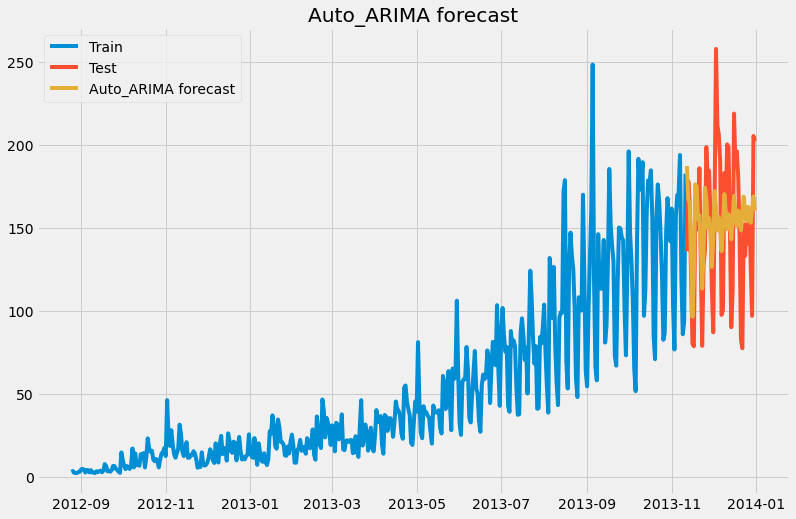

Evaluation metric results:-
MSE is : 1439.7272255564576
MAE is : 31.01227403811502
MAPE is : 23.632762110482187
R2 is : 0.23851199884825902
RMSE is : 37.94373763292775



In [45]:
plot(method=  "Auto_ARIMA")

# SARIMA

m refers to the number of periods in each season.

• 7 → Daily

• 12 → Monthly

• 52 → Weekly

• 4 → Quarterly

• 1 → Annual (non-seasonal)

                                         SARIMAX Results                                         
Dep. Variable:                                     Count   No. Observations:                  444
Model:             SARIMAX(1, 1, 1)x(1, 1, [1, 2, 3], 7)   Log Likelihood               -1776.959
Date:                                   Sat, 09 Oct 2021   AIC                           3567.917
Time:                                           13:07:14   BIC                           3596.461
Sample:                                                0   HQIC                          3579.182
                                                   - 444                                         
Covariance Type:                                     opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3661      0.033     11.127      0.000    

16.331677254771623

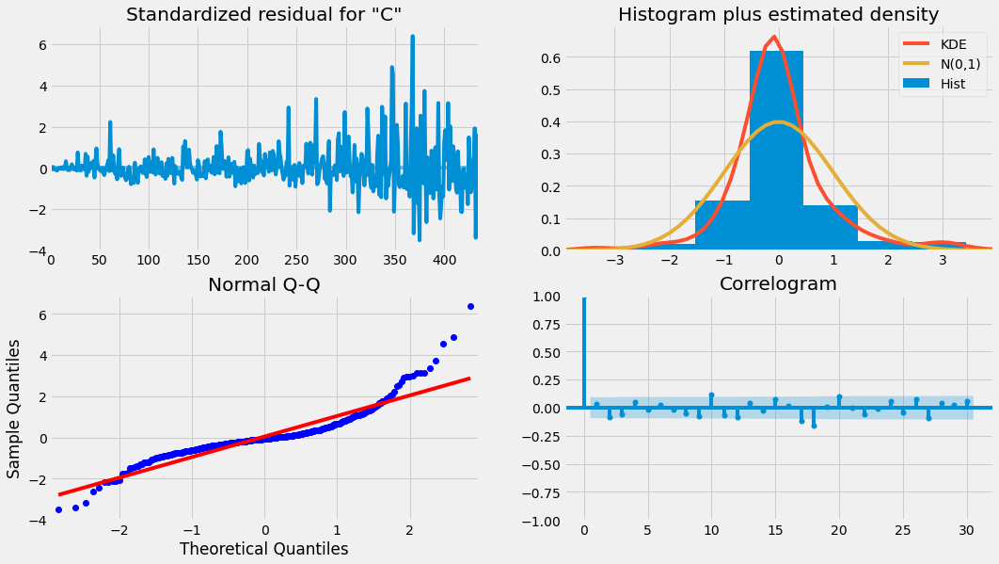

In [50]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
def sarima(p,d,q, P=0,D=0,Q=0,M=7, method = "SARIMA"):


    
    model = SARIMAX(train[time_dependent_variable], order=(p,d,q),  seasonal_order=(P,D,Q,M))
    fit1 = model.fit()
    
    diagnostic_plot(fit1)
    y_hat[method] = fit1.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False, typ='levels')
    
    return metrics_(method)
sarima(1, 1, 1, 1, 1, 3)

                               SARIMAX Results                                
Dep. Variable:                  Count   No. Observations:                  444
Model:                        SARIMAX   Log Likelihood               -2519.502
Date:                Sat, 09 Oct 2021   AIC                           5041.004
Time:                        13:07:19   BIC                           5045.099
Sample:                             0   HQIC                          5042.619
                                - 444                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      4970.2735    273.457     18.176      0.000    4434.308    5506.239
Ljung-Box (L1) (Q):                 338.34   Jarque-Bera (JB):               145.43
Prob(Q):                              0.00   Pr

                                 SARIMAX Results                                 
Dep. Variable:                     Count   No. Observations:                  444
Model:             SARIMAX(1, 0, [1], 7)   Log Likelihood               -1890.520
Date:                   Sat, 09 Oct 2021   AIC                           3787.039
Time:                           13:07:20   BIC                           3799.327
Sample:                                0   HQIC                          3791.885
                                   - 444                                         
Covariance Type:                     opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L7        0.9967      0.003    394.390      0.000       0.992       1.002
ma.S.L7       -0.5187      0.023    -22.821      0.000      -0.563      -0.474
sigma2       275.0419      8

                                     SARIMAX Results                                     
Dep. Variable:                             Count   No. Observations:                  444
Model:             SARIMAX(0, 0, 1)x(0, 1, 1, 7)   Log Likelihood               -1807.695
Date:                           Sat, 09 Oct 2021   AIC                           3621.391
Time:                                   13:07:21   BIC                           3633.630
Sample:                                        0   HQIC                          3626.221
                                           - 444                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.3935      0.027     14.567      0.000       0.341       0.446
ma.S.L7       -0.5781      0.020    -29.530

                                      SARIMAX Results                                      
Dep. Variable:                               Count   No. Observations:                  444
Model:             SARIMAX(0, 1, 0)x(0, 0, [1], 7)   Log Likelihood               -1984.431
Date:                             Sat, 09 Oct 2021   AIC                           3972.863
Time:                                     13:07:22   BIC                           3981.050
Sample:                                          0   HQIC                          3976.092
                                             - 444                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.S.L7        0.4027      0.027     14.977      0.000       0.350       0.455
sigma2       454.1310     1

                                      SARIMAX Results                                      
Dep. Variable:                               Count   No. Observations:                  444
Model:             SARIMAX(0, 1, 0)x(1, 1, [1], 7)   Log Likelihood               -1851.883
Date:                             Sat, 09 Oct 2021   AIC                           3709.765
Time:                                     13:07:23   BIC                           3721.998
Sample:                                          0   HQIC                          3714.593
                                             - 444                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L7        0.0137      0.041      0.337      0.736      -0.066       0.094
ma.S.L7       -0.7945      

                                     SARIMAX Results                                     
Dep. Variable:                             Count   No. Observations:                  444
Model:             SARIMAX(0, 1, 1)x(1, 0, 1, 7)   Log Likelihood               -1837.167
Date:                           Sat, 09 Oct 2021   AIC                           3682.334
Time:                                   13:07:24   BIC                           3698.708
Sample:                                        0   HQIC                          3688.791
                                           - 444                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9408      0.016    -60.042      0.000      -0.971      -0.910
ar.S.L7        0.9880      0.010    103.957

                                      SARIMAX Results                                      
Dep. Variable:                               Count   No. Observations:                  444
Model:             SARIMAX(1, 0, 0)x(0, 1, [1], 7)   Log Likelihood               -1798.670
Date:                             Sat, 09 Oct 2021   AIC                           3603.340
Time:                                     13:07:25   BIC                           3615.580
Sample:                                          0   HQIC                          3608.170
                                             - 444                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4808      0.021     22.457      0.000       0.439       0.523
ma.S.L7       -0.6306      

                                     SARIMAX Results                                     
Dep. Variable:                             Count   No. Observations:                  444
Model:             SARIMAX(1, 0, 1)x(0, 0, 1, 7)   Log Likelihood               -1980.566
Date:                           Sat, 09 Oct 2021   AIC                           3969.132
Time:                                   13:07:27   BIC                           3985.516
Sample:                                        0   HQIC                          3975.593
                                           - 444                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9406      0.012     75.918      0.000       0.916       0.965
ma.L1         -0.1495      0.040     -3.763

ARIMA(1, 0, 1, 1, 1, 0) metric=13.590
                                     SARIMAX Results                                     
Dep. Variable:                             Count   No. Observations:                  444
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 7)   Log Likelihood               -1797.273
Date:                           Sat, 09 Oct 2021   AIC                           3604.547
Time:                                   13:07:28   BIC                           3624.947
Sample:                                        0   HQIC                          3612.597
                                           - 444                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4861      0.079      6.174      0.000       0.332       0.640
ma.L1

                                      SARIMAX Results                                      
Dep. Variable:                               Count   No. Observations:                  444
Model:             SARIMAX(1, 1, 0)x(1, 0, [1], 7)   Log Likelihood               -1869.683
Date:                             Sat, 09 Oct 2021   AIC                           3747.366
Time:                                     13:07:29   BIC                           3763.741
Sample:                                          0   HQIC                          3753.824
                                             - 444                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2437      0.026     -9.254      0.000      -0.295      -0.192
ar.S.L7        0.9868      

                                     SARIMAX Results                                      
Dep. Variable:                              Count   No. Observations:                  444
Model:             SARIMAX(1, 1, 1)x(0, 1, [], 7)   Log Likelihood               -1874.719
Date:                            Sat, 09 Oct 2021   AIC                           3755.438
Time:                                    13:07:30   BIC                           3767.671
Sample:                                         0   HQIC                          3760.265
                                            - 444                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3947      0.021     18.945      0.000       0.354       0.436
ma.L1         -0.9995      0.044   

                                     SARIMAX Results                                      
Dep. Variable:                              Count   No. Observations:                  444
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 7)   Log Likelihood               -1814.234
Date:                            Sat, 09 Oct 2021   AIC                           3636.468
Time:                                    13:07:32   BIC                           3652.779
Sample:                                         0   HQIC                          3642.905
                                            - 444                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3618      0.026     14.054      0.000       0.311       0.412
ma.L1         -0.9930      0.005   

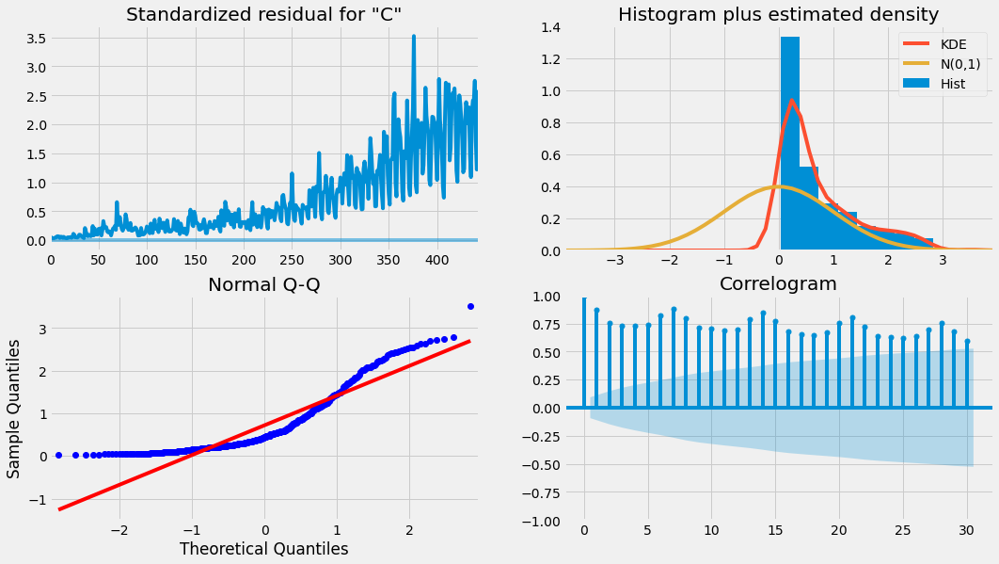

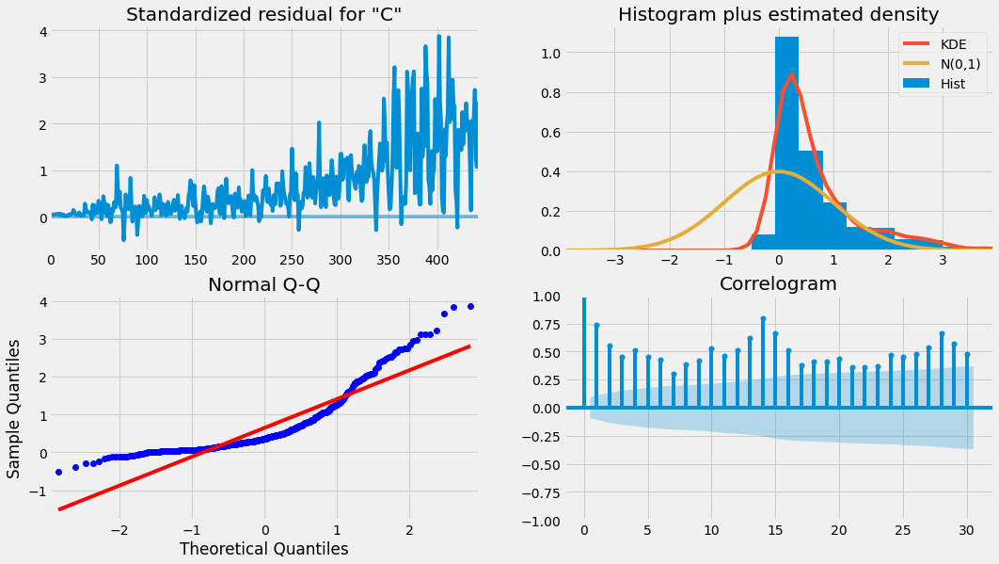

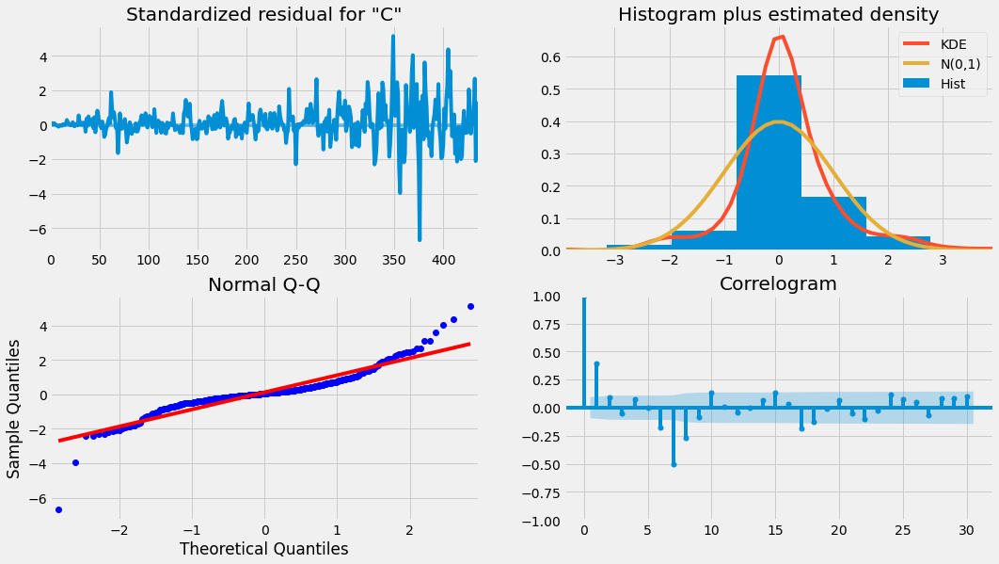

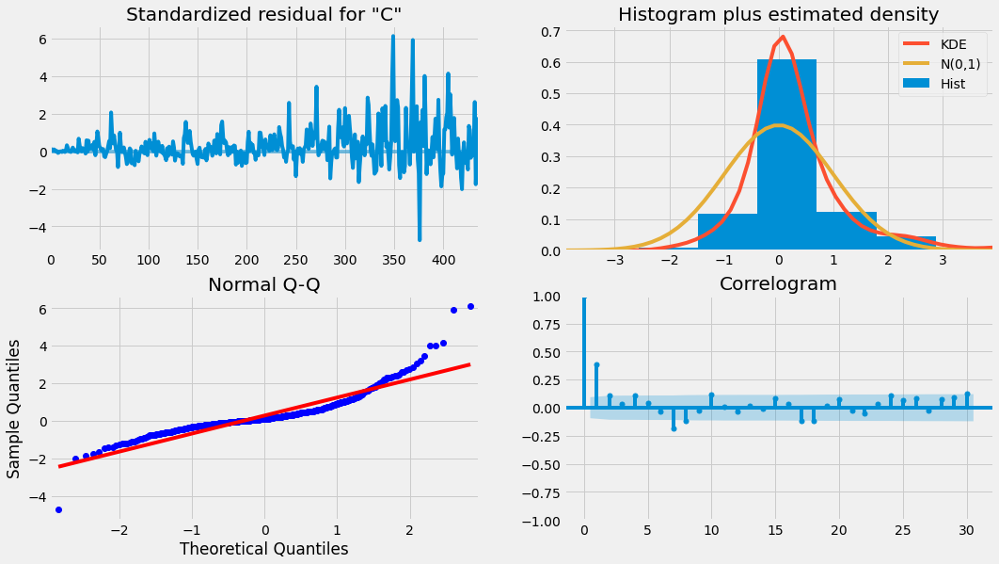

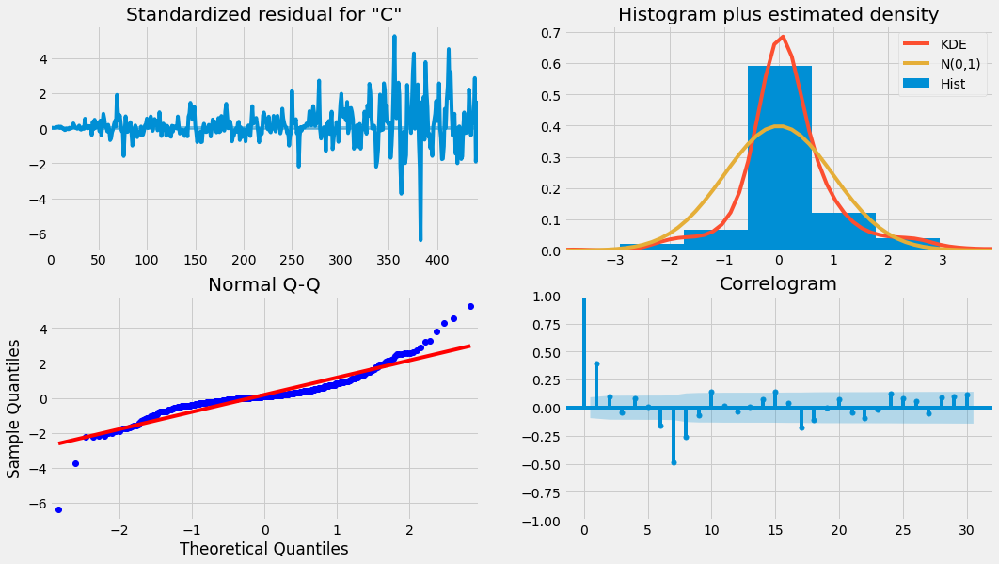

...

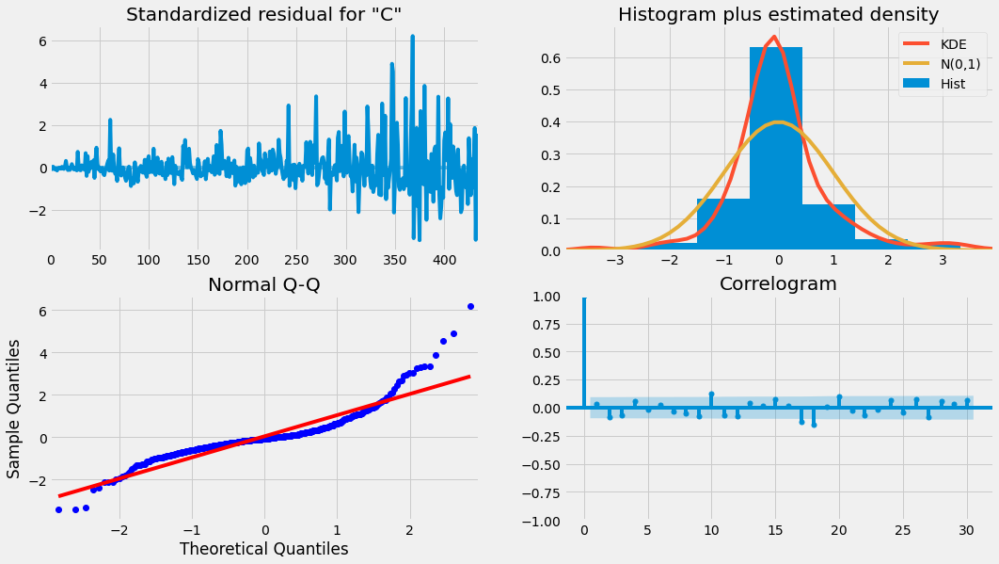

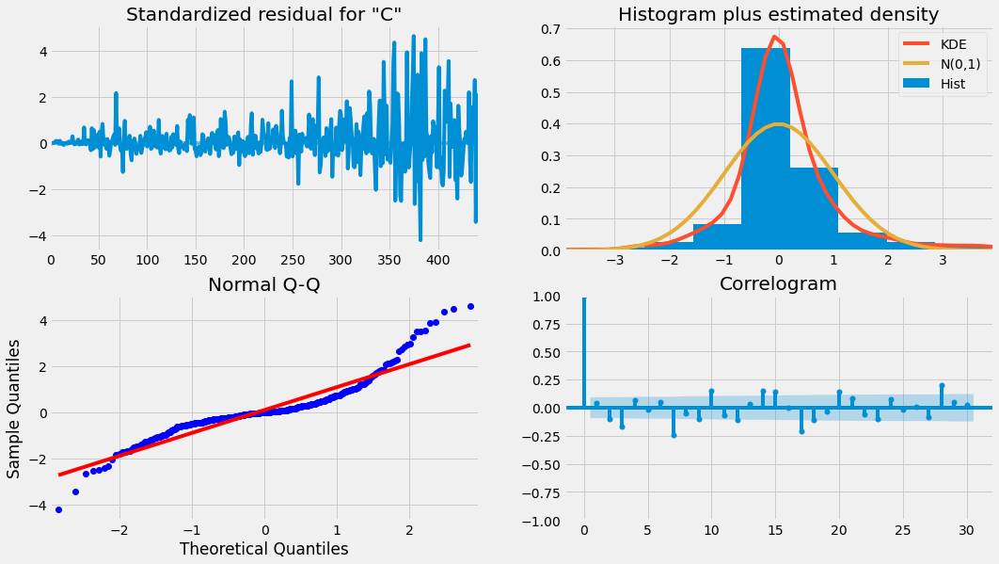

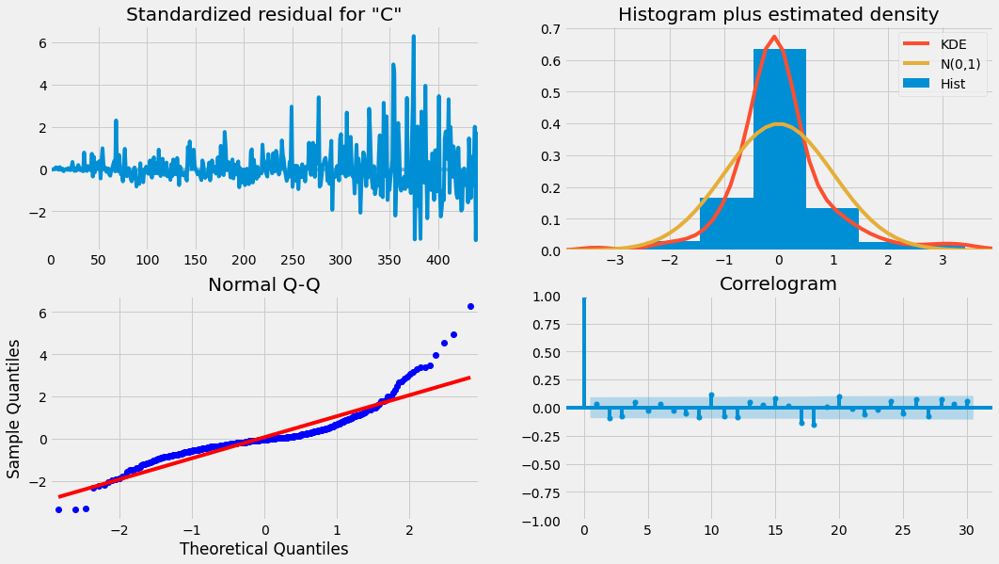

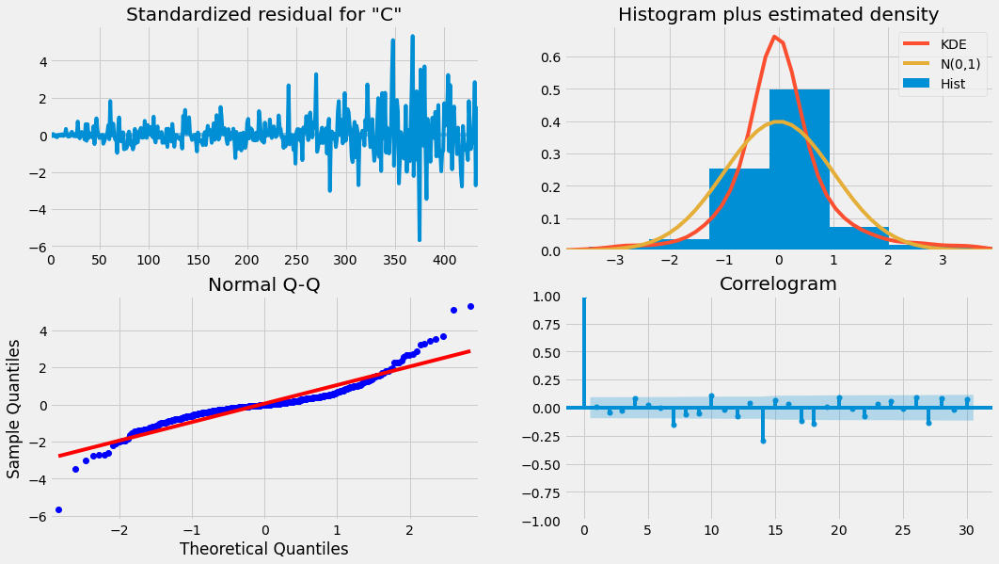

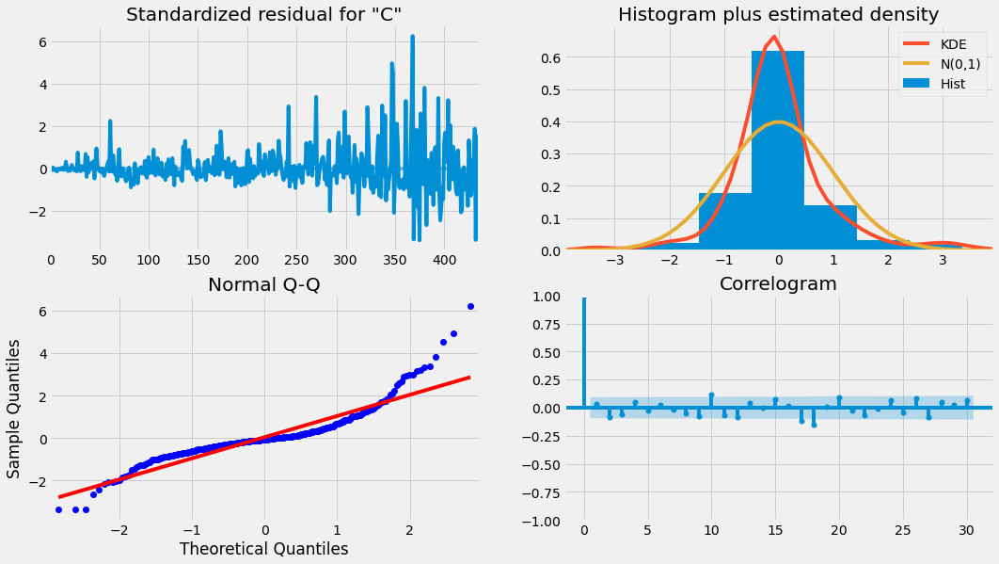

In [51]:
# evaluate combinations of p, d and q values for an ARIMA model
def sarima_best_params(p_values=range(2), d_values=range(2), q_values=range(2), P_values=range(2), D_values=range(2), Q_values=range(2)):
    best_score, best_cfg = float("inf"), None
#for m in [1, 4,7,12,52]:
    for p in p_values:
        for d in d_values:
            for q in q_values:
                    for P in P_values:
                        for D in D_values:
                            for Q in Q_values:
                                order = (p,d,q,P,D,Q)
                                try:
                                    metric = sarima(*order)
                                    if metric < best_score:
                                        best_score, best_cfg = metric, order
                                    print('ARIMA%s metric=%.3f' % (order,metric))
                                except:
                                    continue
    print('Best ARIMA%s metric=%.3f' % (best_cfg, best_score))
    return best_cfg 
    
best_cfg = sarima_best_params()

(0, 0, 0, 1, 1, 0)
                                SARIMAX Results                                
Dep. Variable:                   Count   No. Observations:                  444
Model:             SARIMAX(1, 1, 0, 7)   Log Likelihood               -1855.082
Date:                 Sat, 09 Oct 2021   AIC                           3714.163
Time:                         13:08:05   BIC                           3722.323
Sample:                              0   HQIC                          3717.383
                                 - 444                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L7       -0.4952      0.022    -22.079      0.000      -0.539      -0.451
sigma2       283.6346      8.250     34.379      0.000     267.465     299.805
Ljung-Box (L1) (Q):      

13.541329615266417

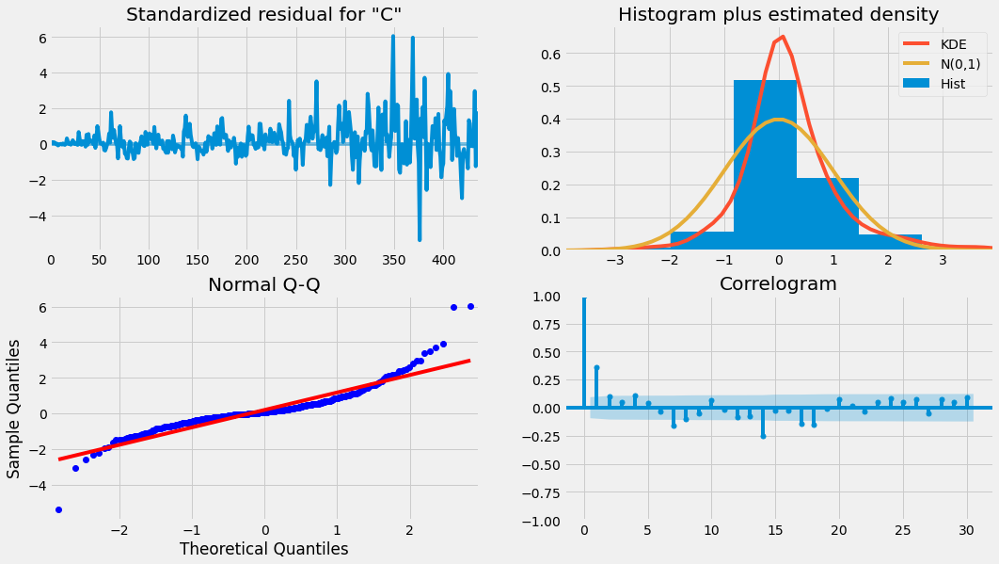

In [52]:
print(best_cfg)
sarima(*best_cfg)

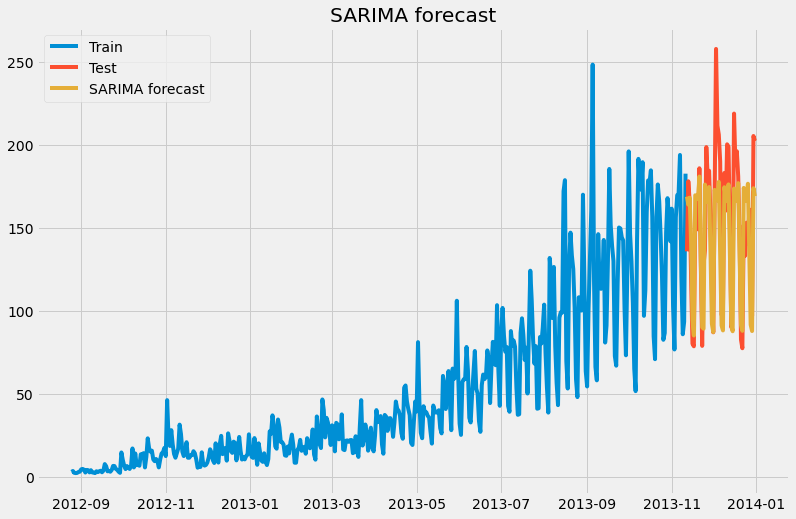

Evaluation metric results:-
MSE is : 715.1413490858079
MAE is : 21.118509941952688
MAPE is : 13.541329615266417
R2 is : 0.6217536580612809
RMSE is : 26.74212686167291



In [53]:
plot(method = "SARIMA")

# Seasonal ARIMA using Pmdarima Library

In [54]:
def auto_sarima(m, max_p= 3, max_q= 3, max_P=3 , max_Q=3  ,method = "Auto_SARIMA"):
    model = pmd.auto_arima(train[time_dependent_variable], 
                               start_p=1, start_q=1,
                                max_p=max_p, max_q=max_q, seasonal=True, start_P=1,
                                start_Q=1, max_P=max_P, max_D=7, max_Q=max_Q, m=m,
                                d=None, D=None, trace=True, error_action='ignore', 
                                suppress_warnings=True,
                                stepwise=True)

    
    
    print("\n\n\n\n")
    print("ARIMA Model Summary is : ")
    print(model.summary())
    print("\n\n\n\n")
    
    y_hat.loc[:,method] = model.predict(len(test))

    print("Test Dataset After Forecast: ")
    print(y_hat.head(5))
    print("\n\n\n\n")
#     arima_model.plot_diagnostics()
    
     
   
    return metrics_(method)
auto_sarima(m = 7)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(1,0,1)[7] intercept   : AIC=3625.980, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=4083.583, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=3868.595, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=3920.334, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=4081.707, Time=0.01 sec
 ARIMA(1,1,1)(0,0,1)[7] intercept   : AIC=3843.667, Time=0.44 sec
 ARIMA(1,1,1)(1,0,0)[7] intercept   : AIC=3742.569, Time=0.45 sec
 ARIMA(1,1,1)(2,0,1)[7] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,1,1)(1,0,2)[7] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,1,1)(0,0,0)[7] intercept   : AIC=3953.178, Time=0.12 sec
 ARIMA(1,1,1)(0,0,2)[7] intercept   : AIC=3783.092, Time=0.72 sec
 ARIMA(1,1,1)(2,0,0)[7] intercept   : AIC=3672.889, Time=0.68 sec
 ARIMA(1,1,1)(2,0,2)[7] intercept   : AIC=3629.126, Time=1.45 sec
 ARIMA(0,1,1)(1,0,1)[7] intercept   : AIC=3683.778, Time=0.54 sec
 ARIMA(1,1,0)(1,0,1)[7] intercept   : AIC=3

15.80048363650125

In [55]:
# for m in [1, 4,7,12,52]:
#     print("="*100)
#     print(f' Fitting SARIMA for Seasonal value m = {str(m)}')
#     auto_sarima(method = "Auto_SARIMA")
def auto_sarima_best_seasonal_params():
    best_score, best_cfg = float("inf"), None
    for m in [1, 4,7,12,52]:
        print("="*100)
        print(f' Fitting SARIMA for Seasonal value m = {str(m)}')
        order = m
        try:
            metric = auto_sarima(m= m)
            if metric < best_score:
                best_score, best_cfg = metric, order
            print('SARIMA%s metric=%.3f' % (order,metric))
        except:
            continue
    print('Best SARIMA%s metric=%.3f' % (best_cfg, best_score))
    return best_cfg
    
best_cfg = auto_sarima_best_seasonal_params()


 Fitting SARIMA for Seasonal value m = 1
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3953.178, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4083.583, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4085.581, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4085.572, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4081.707, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3866.346, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4010.064, Time=0.09 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3866.441, Time=0.28 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3852.295, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3898.051, Time=0.19 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3869.023, Time=0.51 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3857.048, Time=0.55 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3879.980, Time=0.50 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=3850.425, Time=0

 ARIMA(1,1,1)(1,0,1)[7] intercept   : AIC=3625.980, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=4083.583, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=3868.595, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=3920.334, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=4081.707, Time=0.02 sec
 ARIMA(1,1,1)(0,0,1)[7] intercept   : AIC=3843.667, Time=0.43 sec
 ARIMA(1,1,1)(1,0,0)[7] intercept   : AIC=3742.569, Time=0.45 sec
 ARIMA(1,1,1)(2,0,1)[7] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(1,1,1)(1,0,2)[7] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(1,1,1)(0,0,0)[7] intercept   : AIC=3953.178, Time=0.12 sec
 ARIMA(1,1,1)(0,0,2)[7] intercept   : AIC=3783.092, Time=0.82 sec
 ARIMA(1,1,1)(2,0,0)[7] intercept   : AIC=3672.889, Time=0.78 sec
 ARIMA(1,1,1)(2,0,2)[7] intercept   : AIC=3629.126, Time=1.48 sec
 ARIMA(0,1,1)(1,0,1)[7] intercept   : AIC=3683.778, Time=0.56 sec
 ARIMA(1,1,0)(1,0,1)[7] intercept   : AIC=3749.359, Time=0.23 sec
 ARIMA(2,1,1)(1,0,1)

 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=3907.351, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=4083.583, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=4032.123, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=3978.419, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=4081.707, Time=0.01 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=3905.414, Time=0.35 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=3953.178, Time=0.15 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=3907.216, Time=0.87 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=3916.846, Time=0.33 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.86 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=4024.419, Time=0.17 sec
 ARIMA(2,1,1)(0,0,1)[12] intercept   : AIC=3843.526, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=3866.346, Time=0.21 sec
 ARIMA(2,1,1)(1,0,1)[12] intercept   : AIC=3844.104, Time=0.43 sec
 ARIMA(2,1,1)(0,0,2)[12] intercept   : AIC=3841.883, Time=0.86 sec


 ARIMA(3,1,1)(0,0,0)[52] intercept   : AIC=3866.441, Time=0.25 sec
 ARIMA(2,1,2)(0,0,0)[52] intercept   : AIC=3852.295, Time=0.33 sec
 ARIMA(2,1,2)(1,0,0)[52] intercept   : AIC=3854.054, Time=6.85 sec
 ARIMA(2,1,2)(0,0,1)[52] intercept   : AIC=3854.059, Time=5.61 sec
 ARIMA(2,1,2)(1,0,1)[52] intercept   : AIC=inf, Time=8.17 sec
 ARIMA(1,1,2)(0,0,0)[52] intercept   : AIC=3898.051, Time=0.20 sec
 ARIMA(3,1,2)(0,0,0)[52] intercept   : AIC=3869.023, Time=0.48 sec
 ARIMA(2,1,3)(0,0,0)[52] intercept   : AIC=3857.048, Time=0.47 sec
 ARIMA(1,1,3)(0,0,0)[52] intercept   : AIC=3879.980, Time=0.36 sec
 ARIMA(3,1,3)(0,0,0)[52] intercept   : AIC=3850.425, Time=0.45 sec
 ARIMA(3,1,3)(1,0,0)[52] intercept   : AIC=3830.027, Time=8.21 sec
 ARIMA(3,1,3)(2,0,0)[52] intercept   : AIC=3825.619, Time=40.34 sec
 ARIMA(3,1,3)(3,0,0)[52] intercept   : AIC=3849.636, Time=115.73 sec
 ARIMA(3,1,3)(2,0,1)[52] intercept   : AIC=3831.861, Time=50.72 sec
 ARIMA(3,1,3)(1,0,1)[52] intercept   : AIC=3830.034, Time=12.96

In [56]:
auto_sarima(m= best_cfg)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(1,0,1)[7] intercept   : AIC=3625.980, Time=1.10 sec
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=4083.583, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=3868.595, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=3920.334, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=4081.707, Time=0.01 sec
 ARIMA(1,1,1)(0,0,1)[7] intercept   : AIC=3843.667, Time=0.53 sec
 ARIMA(1,1,1)(1,0,0)[7] intercept   : AIC=3742.569, Time=0.55 sec
 ARIMA(1,1,1)(2,0,1)[7] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(1,1,1)(1,0,2)[7] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(1,1,1)(0,0,0)[7] intercept   : AIC=3953.178, Time=0.16 sec
 ARIMA(1,1,1)(0,0,2)[7] intercept   : AIC=3783.092, Time=0.84 sec
 ARIMA(1,1,1)(2,0,0)[7] intercept   : AIC=3672.889, Time=0.90 sec
 ARIMA(1,1,1)(2,0,2)[7] intercept   : AIC=3629.126, Time=1.64 sec
 ARIMA(0,1,1)(1,0,1)[7] intercept   : AIC=3683.778, Time=0.62 sec
 ARIMA(1,1,0)(1,0,1)[7] intercept   : AIC=3

15.80048363650125

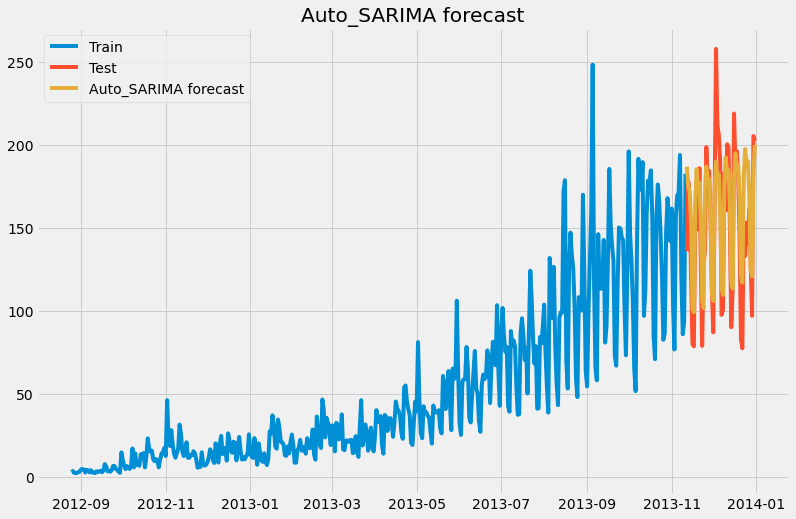

Evaluation metric results:-
MSE is : 697.248618430801
MAE is : 21.09656000096616
MAPE is : 15.80048363650125
R2 is : 0.6312173255253462
RMSE is : 26.405465692367574



In [57]:
plot(method=  "Auto_SARIMA")